# Project: Credit score prediction

Link to the dataset: https://www.kaggle.com/prasy46/credit-score-prediction

## About the data from a publisher:
We provide you with a data set in CSV format.
The data set contains 8,000 train instances and 2000 test instance
There are 304 input features, labeled x001 to x304.

The target variable is labeled y.

### Task Create a model to predict the target variable y.
A report - A Power point presentation
Any custom code you used
Instructions for me to run your model on a separate data set

<h4>Steps:</h4>
<ol>
  <li>Data Analysis</li>
  <li>Feature Engineering</li>
  <li>Feature Selection</li>
  <li>Model Training</li>
  <li>Obtaining Predictions / Scoring</li>
</ol>

<b>Dependencies and versions</b>

In [1]:
# importing libraries
from platform import python_version
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.stats as stats

import warnings
warnings.filterwarnings("ignore")

In [2]:
# showing versions
print('Python version:',python_version())
print('NumPy version:',np.__version__)
print('Pandas version:',pd.__version__)
print('SciPy version:',scipy.__version__)

Python version: 3.8.8
NumPy version: 1.20.2
Pandas version: 1.2.4
SciPy version: 1.6.2


<h2>STEP 1: Data analysis</h2>

In [3]:
# importing the training dataset
df_train = pd.read_csv("CreditScore_train.csv")

In [4]:
# shape
df_train.shape

(80000, 305)

In [5]:
# importing the test dataset
df_test = pd.read_csv("CreditScore_test.csv")

In [6]:
# shape
df_test.shape

(20000, 305)

In [7]:
# showing first five rows of the training dateset
pd.pandas.set_option('display.max_columns', None, 'display.max_rows', None, )
df_train.head()

,x001,x002,x003,x004,x005,x006,x007,x008,x009,x010,x011,x012,x013,x014,x015,x016,x017,x018,x019,x020,x021,x022,x023,x024,x025,x026,x027,x028,x029,x030,x031,x032,x033,x034,x035,x036,x037,x038,x039,x040,x041,x042,x043,x044,x045,x046,x047,x048,x049,x050,x051,x052,x053,x054,x055,x056,x057,x058,x059,x060,x061,x062,x063,x064,x065,x066,x067,x068,x069,x070,x071,x072,x073,x074,x075,x076,x077,x078,x079,x080,x081,x082,x083,x084,x085,x086,x087,x088,x089,x090,x091,x092,x093,x094,x095,x096,x097,x098,x099,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x111,x112,x113,x114,x115,x116,x117,x118,x119,x120,x121,x122,x123,x124,x125,x126,x127,x128,x129,x130,x131,x132,x133,x134,x135,x136,x137,x138,x139,x140,x141,x142,x143,x144,x145,x146,x147,x148,x149,x150,x151,x152,x153,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x165,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x182,x183,x184,x185,x186,x187,x188,x189,x190,x191,x192,x193,x194,x195,x196,x197,x198,x199,x200,x201,x202,x203,x204,x205,x206,x207,x208,x209,x210,x211,x212,x213,x214,x215,x216,x217,x218,x219,x220,x221,x222,x223,x224,x225,x226,x227,x228,x229,x230,x231,x232,x233,x234,x235,x236,x237,x238,x239,x240,x241,x242,x243,x244,x245,x246,x247,x248,x249,x250,x251,x252,x253,x254,x255,x256,x257,x258,x259,x260,x261,x262,x263,x264,x265,x266,x267,x268,x269,x270,x271,x272,x273,x274,x275,x276,x277,x278,x279,x280,x281,x282,x283,x284,x285,x286,x287,x288,x289,x290,x291,x292,x293,x294,x295,x296,x297,x298,x299,x300,x301,x302,x303,x304,y
0,1084094,426.0,39.0,128.0,426.0,0,0,0,0,0,2,4,4,9,19,5,14,8,5,6,2,3,2,1,1,1,1,6,1,5,0,0,0,0,0,0,0,0,0,0,0.6959,197600,60073,140000.0,200.0,2,0,0,0,0,0,0,0,0,1,0,0.9754,0.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0000,1.0000,2,2,2,2,2,2,0,0,0,967,812.0,27600.0,51633,426.0,62.0,244.0000,0,0,NaN,0,1,1,1,1,1,1,9,2,0,1.0,0,61.0,53.0,57.0,483322,0.8827,1,1,1,0,0,NaN,NaN,NaN,NaN,0,0,0,0.1943,484289,0,NaN,0,0,0,484289,0,484289,1,1,1,0,0,1.0,NaN,NaN,NaN,0,346762,NaN,0,NaN,0,NaN,0,0,0,0,NaN,0,NaN,807
1,1287777,160.0,2.0,64.0,160.0,1,1,2,0,1,3,3,7,5,21,5,16,5,3,9,2,3,1,9,1,1,1,3,9,6,0,0,0,0,0,0,0,0,0,0,0.0269,25000,24327,18000.0,600.0,2,0,0,0,0,0,0,0,0,0,0,0.0557,0.0077,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0000,1.0000,2,2,2,2,1,0,0,0,0,673,557.0,18000.0,24327,160.0,102.0,131.0000,1,0,NaN,0,1,1,1,1,1,1,3,1,0,1.0,0,49.0,49.0,49.0,107316,0.9172,1,1,1,1,17318,9.0,2.0,5.5,0.8417,1,1,1,0.2356,125307,0,NaN,0,0,0,125307,0,125307,1,1,1,2,0,1.0,9.0,2.0,5.5,17318,124634,0.8417,0,NaN,17318,0.8417,1,1,1,0,NaN,0,NaN,819
2,1483016,163.0,16.0,104.0,239.0,0,0,0,1,0,1,0,0,6,8,3,5,4,2,7,3,3,2,0,0,0,1,0,0,4,1,0,0,0,1,1,0,0,0,1,0.0458,15400,14694,9000.0,500.0,1,1,0,0,0,0,0,0,0,0,0,0.1079,0.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.6666,0.6666,2,2,2,2,0,0,0,0,0,706,637.0,9000.0,14694,163.0,16.0,104.3333,0,0,NaN,0,1,1,1,1,0,0,0,0,0,NaN,0,NaN,NaN,NaN,0,NaN,0,0,0,0,0,NaN,NaN,NaN,NaN,0,0,0,0.0308,706,0,NaN,0,0,0,706,0,706,1,1,1,0,0,NaN,NaN,NaN,NaN,0,0,NaN,0,NaN,0,NaN,0,0,0,0,NaN,0,NaN,803
3,959054,NaN,NaN,NaN,102.0,0,0,0,0,0,0,2,2,0,4,0,4,2,0,0,0,0,0,3,0,0,0,0,0,0,7,0,0,1,4,6,0,0,1,3,NaN,0

In [8]:
# showing data types
df_train.dtypes

x001      int64
x002    float64
x003    float64
x004    float64
x005    float64
x006      int64
x007      int64
x008      int64
x009      int64
x010      int64
x011      int64
x012      int64
x013      int64
x014      int64
x015      int64
x016      int64
x017      int64
x018      int64
x019      int64
x020      int64
x021      int64
x022      int64
x023      int64
x024      int64
x025      int64
x026      int64
x027      int64
x028      int64
x029      int64
x030      int64
x031      int64
x032      int64
x033      int64
x034      int64
x035      int64
x036      int64
x037      int64
x038      int64
x039      int64
x040      int64
x041    float64
x042      int64
x043      int64
x044    float64
x045    float64
x046      int64
x047      int64
x048      int64
x049      int64
x050      int64
x051      int64
x052      int64
x053      int64
x054      int64
x055      int64
x056      int64
x057    float64
x058    float64
x059      int64
x060      int64
x061      int64
x062      int64
x063    

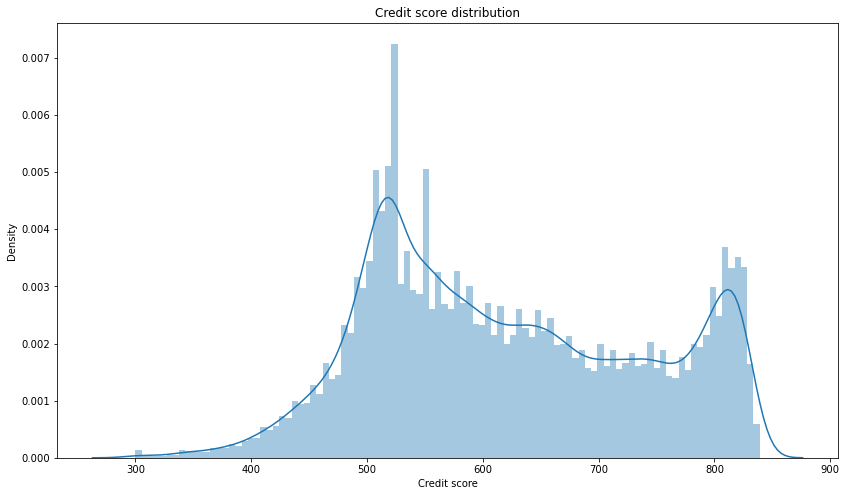

In [9]:
# plotting distribution of the target
plt.figure(figsize=(14,8))

ax = sns.distplot(df_train['y'],bins=100)

plt.title('Credit score distribution')
plt.xlabel('Credit score')

plt.show()

<b>Numerical variables</b>

In [10]:
# all of the dependent variables are the numerical variables
num_vars = [var for var in df_train.columns if var != 'y']
len(num_vars)

304

<b>Missing values</b>

In [11]:
# checking duplicated rows
df_train.duplicated().sum()

0

In [12]:
# checking missing values
df_train.isnull().any(axis = 1).sum()

79982

In [13]:
# making a list of the variables that contain missing values
vars_with_na = [var for var in df_train.columns if df_train[var].isnull().sum() > 0]

# determine percentage of missing values (expressed as decimals)
# and display the result ordered by % of missin data

df_train[vars_with_na].isnull().mean().sort_values(ascending=False)

x242    0.933875
x295    0.865962
x304    0.818200
x098    0.806713
x155    0.791412
x259    0.775438
x255    0.770175
x257    0.770175
x256    0.770175
x302    0.730888
x268    0.673288
x162    0.665500
x267    0.665262
x266    0.665262
x265    0.665262
x253    0.663937
x297    0.580475
x275    0.562588
x293    0.511138
x289    0.497362
x290    0.497362
x288    0.497362
x148    0.418375
x223    0.371138
x222    0.370312
x041    0.368925
x058    0.368925
x057    0.368925
x238    0.367925
x239    0.367925
x237    0.367925
x287    0.247975
x002    0.214812
x003    0.214812
x004    0.214762
x235    0.201187
x045    0.196912
x044    0.196912
x234    0.191450
x272    0.071900
x005    0.060838
dtype: float64

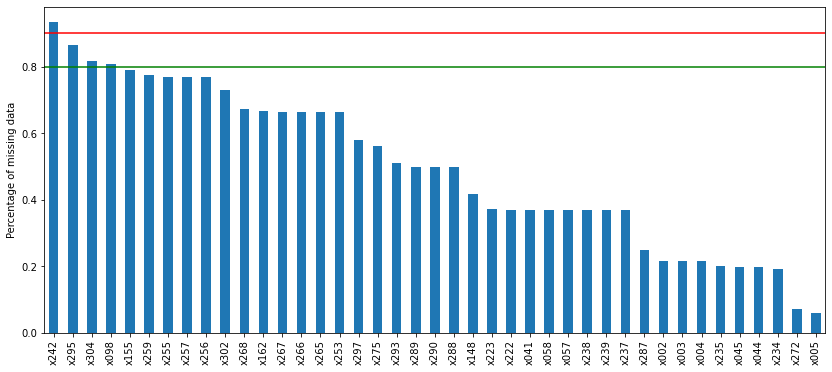

In [14]:
# plot

df_train[vars_with_na].isnull().mean().sort_values(
    ascending=False).plot.bar(figsize=(14, 6))
plt.ylabel('Percentage of missing data')
plt.axhline(y=0.90, color='r', linestyle='-')
plt.axhline(y=0.80, color='g', linestyle='-')

plt.show()

<b>Relationship between missing data and credit score</b>

Evaluating the credit score in those observations where the information is missing. Doing this for each variable that shows missing data.

In [15]:
def analyse_na_value(df, var):

    # copy of the dataframe, so that we do not override the original data
    # see the link for more details about pandas.copy()
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.copy.html
    df = df.copy()

    # let's make an interim variable that indicates 1 if the
    # observation was missing or 0 otherwise
    df[var] = np.where(df[var].isnull(), 1, 0)

    # let's compare the median SalePrice in the observations where data is missing
    # vs the observations where data is available

    # determine the median price in the groups 1 and 0,
    # and the standard deviation of the sale price,
    # and we capture the results in a temporary dataset
    tmp = df.groupby(var)['y'].agg(['mean', 'std'])

    # plot into a bar graph
    tmp.plot(kind="barh", y="mean", legend=False,
             xerr="std", title="Credit score", color='green')

    plt.show()

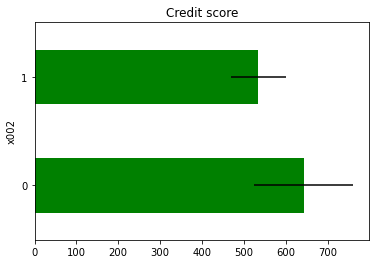

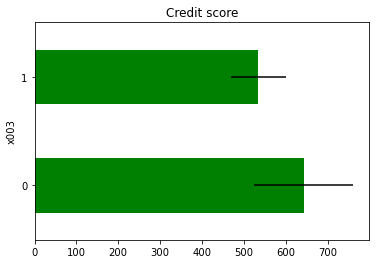

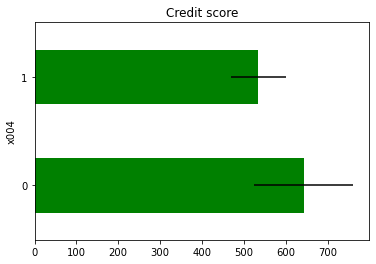

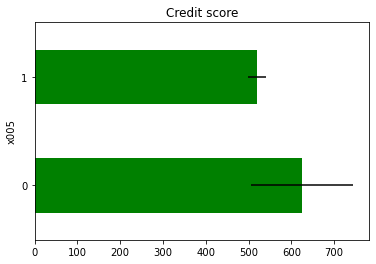

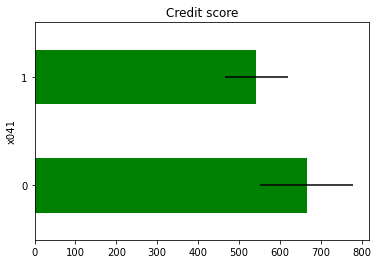

...

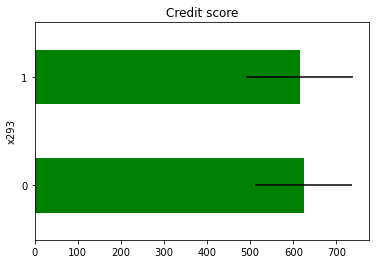

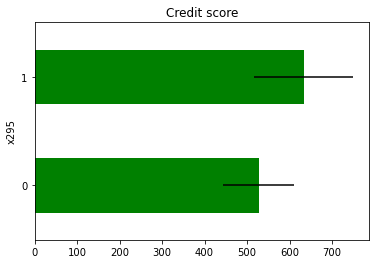

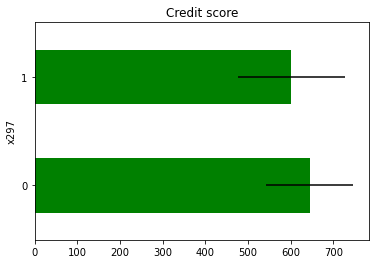

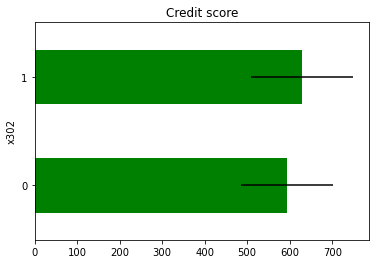

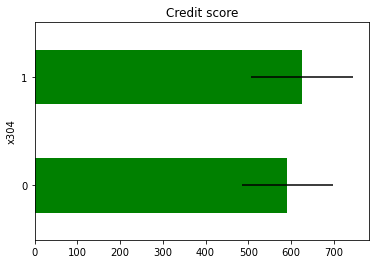

In [16]:
# running the function on each variable with missing data

for var in vars_with_na:
    analyse_na_value(df_train, var)

In some variables, the average credit score in cases where the information is missing, differs from the average credit score in case where information exists. This suggests that data being missing could be a good predictor of Sale Price.

<b>Numerical variables</b>

In [17]:
print('Number of numerical variables: ', len(num_vars))

Number of numerical variables:  304


Finding which variables are discrete, i.e., show a finite number of values

In [18]:
#  let's male a list of discrete variables
discrete_vars = [var for var in num_vars if len(df_train[var].unique()) < 120]
print('Number of discrete variables: ', len(discrete_vars))

Number of discrete variables:  224


In [19]:
# visualising the discrete variables
df_train[discrete_vars].head()

,x006,x007,x008,x009,x010,x011,x012,x013,x014,x016,x017,x018,x019,x020,x021,x022,x023,x024,x025,x026,x027,x028,x029,x030,x031,x032,x033,x034,x035,x036,x037,x038,x039,x040,x046,x047,x048,x049,x050,x051,x052,x053,x054,x055,x056,x059,x060,x061,x062,x063,x064,x065,x066,x067,x068,x069,x070,x071,x072,x073,x074,x076,x077,x078,x079,x080,x081,x082,x083,x084,x085,x086,x087,x088,x089,x090,x091,x092,x093,x094,x095,x096,x097,x099,x100,x101,x102,x103,x104,x105,x106,x107,x108,x109,x110,x112,x113,x114,x115,x116,x117,x118,x122,x123,x124,x125,x126,x127,x128,x132,x133,x134,x135,x136,x137,x138,x142,x143,x144,x147,x148,x149,x150,x151,x152,x153,x154,x155,x156,x157,x158,x159,x160,x161,x162,x163,x164,x165,x166,x167,x168,x169,x170,x171,x172,x173,x174,x175,x176,x177,x178,x179,x180,x181,x182,x183,x184,x185,x187,x188,x189,x190,x191,x192,x193,x197,x198,x199,x200,x201,x202,x203,x207,x208,x209,x210,x211,x212,x213,x217,x218,x224,x225,x226,x227,x228,x229,x230,x231,x232,x240,x241,x244,x245,x246,x247,x248,x249,x250,x251,x252,x253,x254,x260,x261,x262,x263,x269,x270,x271,x276,x277,x278,x282,x283,x284,x285,x286,x287,x298,x299,x300,x301,x302
0,0,0,0,0,0,2,4,4,9,5,14,8,5,6,2,3,2,1,1,1,1,6,1,5,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,2,2,0,0,0,0,0,1,1,1,1,1,1,9,2,0,1.0,0,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,1.0,0,0,0,0,NaN
1,1,1,2,0,1,3,3,7,5,5,16,5,3,9,2,3,1,9,1,1,1,3,9,6,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,1,0,0,0,0,1,0,1,1,1,1,1,1,3,1,0,1.0,0,1,1,1,1,1,1,1,0,0,0,1,1,1,2,0,1.0,1,1,1,0,NaN
2,0,0,0,1,0,1,0,0,6,3,5,4,2,7,3,3,2,0,0,0,1,0,0,4,1,0,0,0,1,1,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,2,2,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,NaN,0,0,0,0,NaN
3,0,0,0,0,0,0,2,2,0,0,4,2,0,0,0,0,0,3,0,0,0,0,0,0,7,0,0,1,4,6,0,0,1,3,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,NaN,0,0,0,0,0,0,NaN,0,0,0,0,0,2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,9.0,1,1,1,0,NaN
4,0,2,2,0,0,1,2,0,0,2,3,2,2,2,1,1,1,3,0,1,1,0,3,2,3,0,1,1,1,3,0,1,1,1,0,0,0,0,0,0,0,0,0,0,2,2,0,0,0,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,1,0,0,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,3.0,1,1,1,1,1,0,NaN,0,0,0,0,0,0,1.0,0,0,0,0,0,3,0,0,0,1,3,1,0,0,0,0,1,0,1,0,1,0,0,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,1,1,1,1,1,0,0,0,0,0,NaN,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,0,9.0,1,1,1,0,NaN


 Analysing their contribution to the credit score

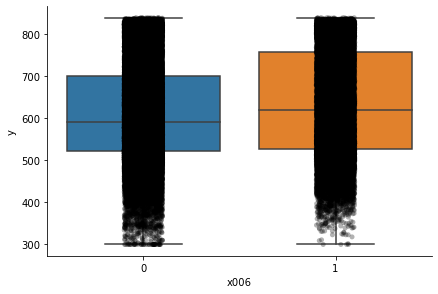

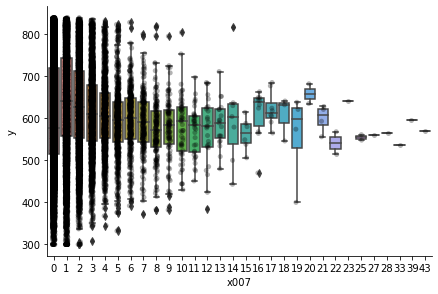

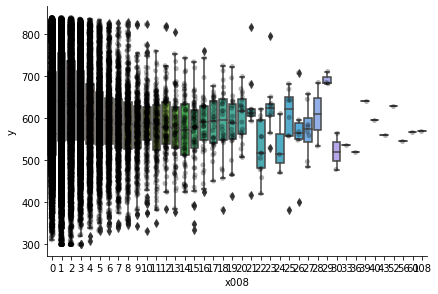

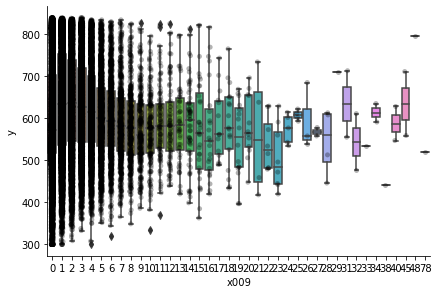

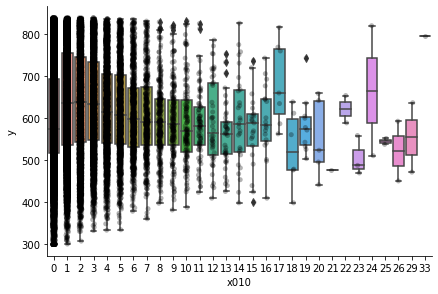

...

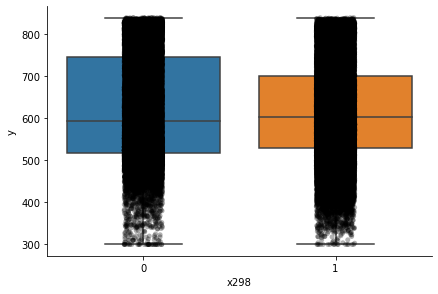

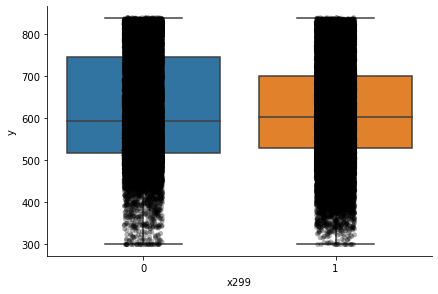

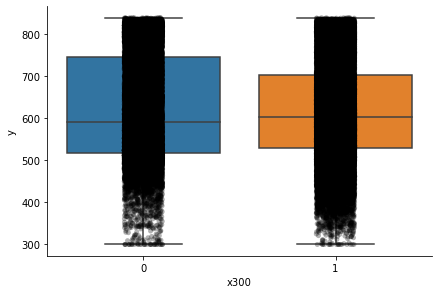

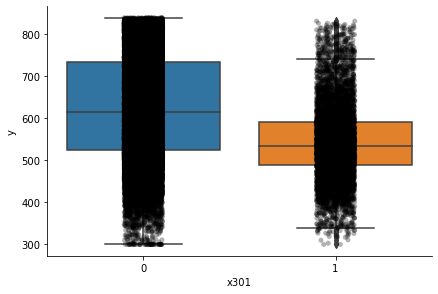

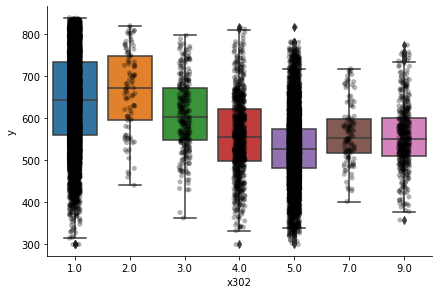

In [20]:
for var in discrete_vars:
    # make boxplot with Catplot
    sns.catplot(x=var, y='y', data=df_train, kind="box", height=4, aspect=1.5)
    # add data points to boxplot with stripplot
    sns.stripplot(x=var, y='y', data=df_train, jitter=0.1, alpha=0.3, color='k')
    plt.show()

Some variables influence the credit score. For some variables, there isn't any difference - most likely that variable is not a good predictor of sale price. Some variables have only a single value and cannot predict anything.

<b>Continuous variables</b>

Finding the distribution of the continuous variables.

In [21]:
# making list of continuous variables
cont_vars = [var for var in num_vars if var not in discrete_vars]

print('Number of continuous variables: ', len(cont_vars))

Number of continuous variables:  80


In [22]:
# visualising the continuous variables
df_train[cont_vars].head()

,x001,x002,x003,x004,x005,x015,x041,x042,x043,x044,x045,x057,x058,x075,x098,x111,x119,x120,x121,x129,x130,x131,x139,x140,x141,x145,x146,x186,x194,x195,x196,x204,x205,x206,x214,x215,x216,x219,x220,x221,x222,x223,x233,x234,x235,x236,x237,x238,x239,x242,x243,x255,x256,x257,x258,x259,x264,x265,x266,x267,x268,x272,x273,x274,x275,x279,x280,x281,x288,x289,x290,x291,x292,x293,x294,x295,x296,x297,x303,x304
0,1084094,426.0,39.0,128.0,426.0,19,0.6959,197600,60073,140000.0,200.0,0.9754,0.0000,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0000,1.0000,967,812.0,27600.0,51633,426.0,62.0,244.0000,NaN,0,61.0,53.0,57.0,483322,0.8827,0,NaN,NaN,NaN,NaN,0.1943,484289,0,NaN,484289,0,484289,NaN,NaN,NaN,0,346762,NaN,0,NaN,0,NaN,0,NaN
1,1287777,160.0,2.0,64.0,160.0,21,0.0269,25000,24327,18000.0,600.0,0.0557,0.0077,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0000,1.0000,673,557.0,18000.0,24327,160.0,102.0,131.0000,NaN,0,49.0,49.0,49.0,107316,0.9172,17318,9.0,2.0,5.5,0.8417,0.2356,125307,0,NaN,125307,0,125307,9.0,2.0,5.5,17318,124634,0.8417,0,NaN,17318,0.8417,0,NaN
2,1483016,163.0,16.0,104.0,239.0,8,0.0458,15400,14694,9000.0,500.0,0.1079,0.0000,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.6666,0.6666,706,637.0,9000.0,14694,163.0,16.0,104.3333,NaN,0,NaN,NaN,NaN,0,NaN,0,NaN,NaN,NaN,NaN,0.0308,706,0,NaN,706,0,706,NaN,NaN,NaN,0,0,NaN,0,NaN,0,NaN,0,NaN
3,959054,NaN,NaN,NaN,102.0,4,NaN,0,0,NaN,NaN,NaN,NaN,117,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,0,NaN,NaN,0,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,0,NaN,0,NaN,NaN,NaN,NaN,0.3025,619,619,0.8123,0,0,0,NaN,NaN,NaN,0,0,NaN,0,NaN,0,NaN,0,NaN
4,1342113,3.0,2.0,2.0,62.0,5,1.4199,300,-126,300.0,300.0,1.4199,1.4199,316,NaN,1,1,1,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,1.0000,1.0000,845,426.0,300.0,-126,3.0,3.0,3.0000,1.4199,426,NaN,NaN,NaN,0,NaN,17413,2.0,2.0,2.0,1.0180,0.8402,38837,21424,0.7357,17839,426,17413,2.0,2.0,2.0,17413,17413,1.0180,0,NaN,17413,1.0180,0,NaN


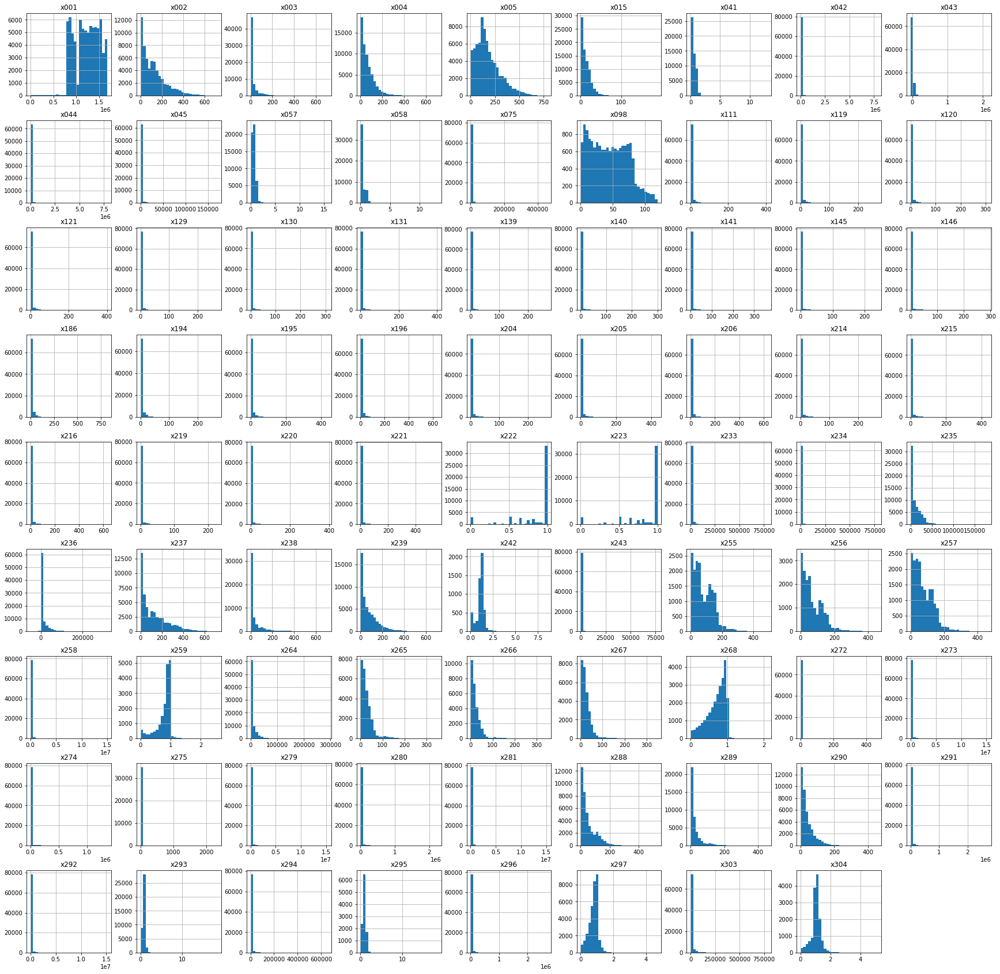

In [23]:
# plotting histograms for all continuous numerical variables
df_train[cont_vars].hist(bins=30, figsize=(30,30))
plt.show()

In [24]:
# function to create histogram, Q-Q plot and boxplot
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')
    
    plt.show()

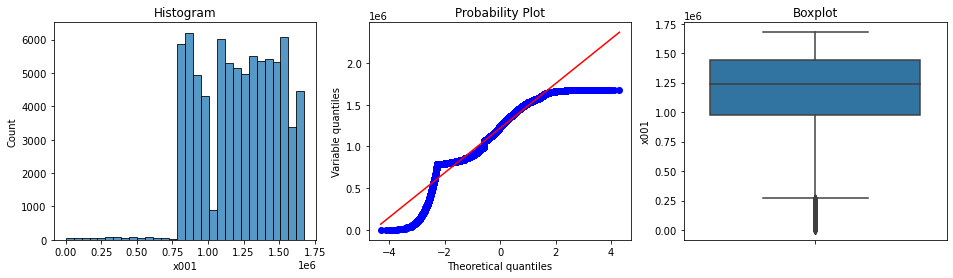

skewness of x001 is -0.36


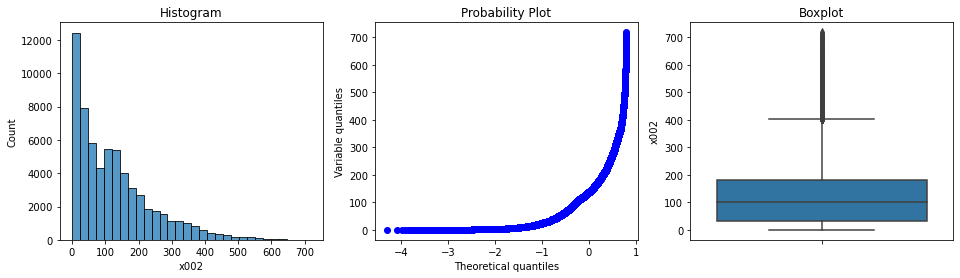

skewness of x002 is 1.31


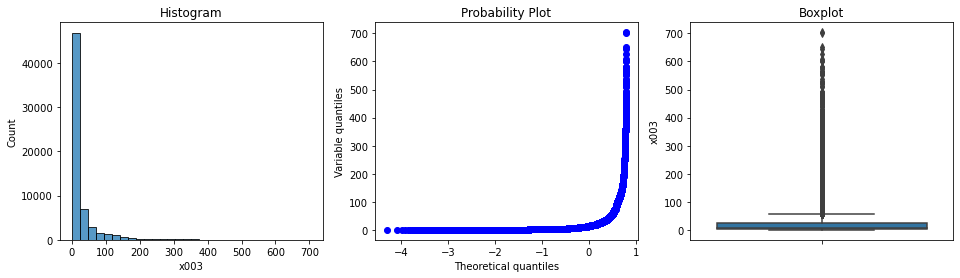

skewness of x003 is 4.17


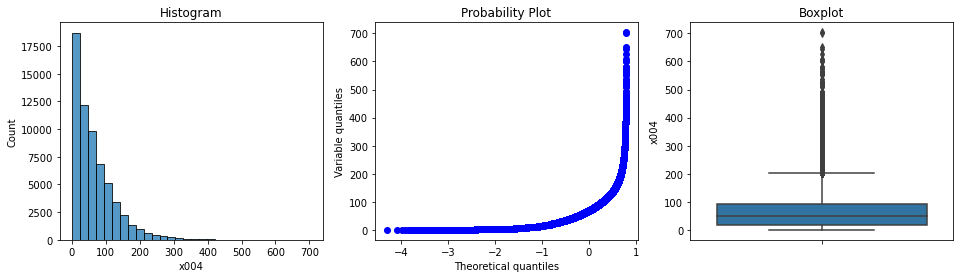

skewness of x004 is 2.01


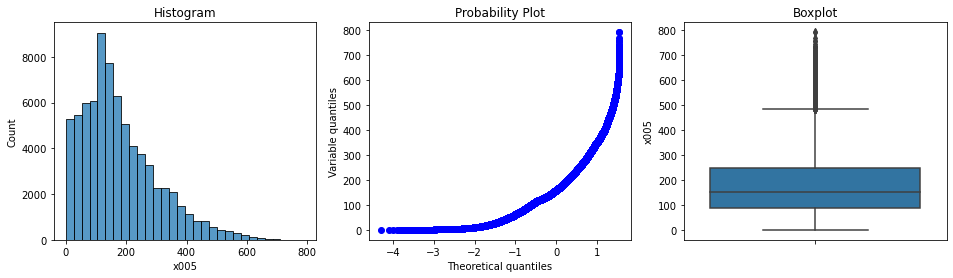

skewness of x005 is 1.03


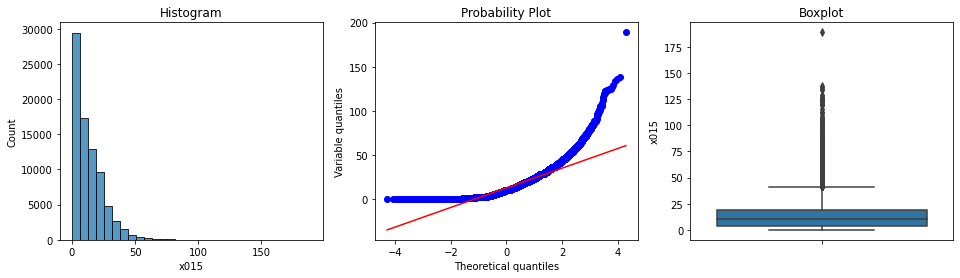

skewness of x015 is 1.78


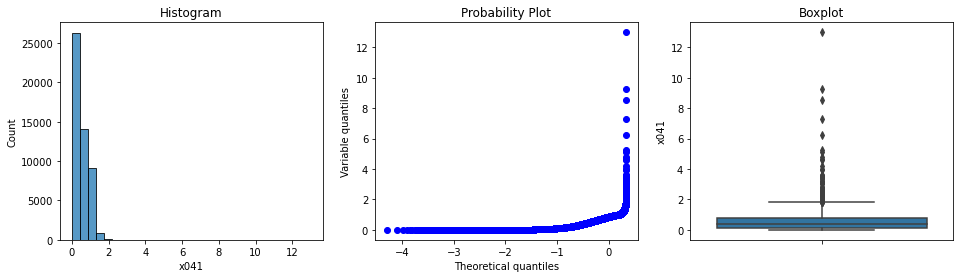

skewness of x041 is 1.87


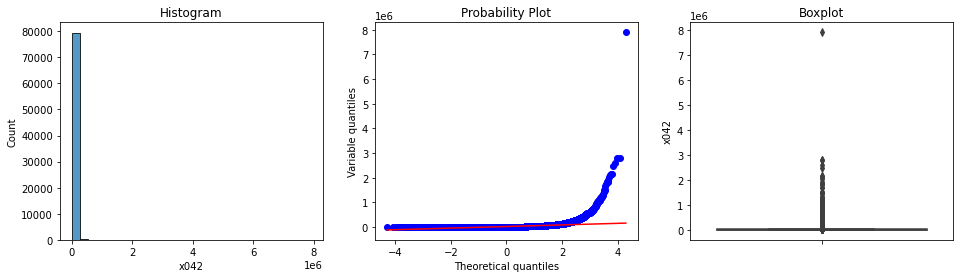

skewness of x042 is 34.05


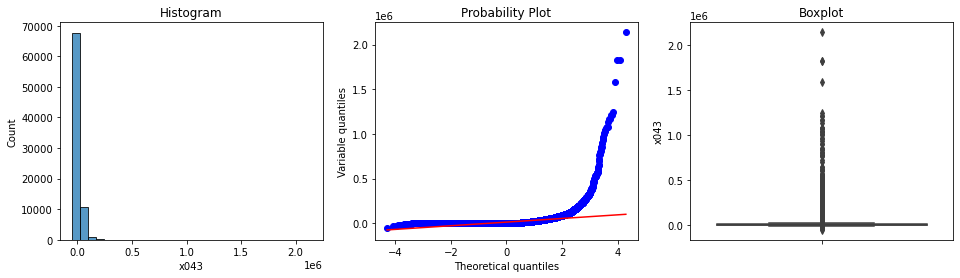

skewness of x043 is 16.61


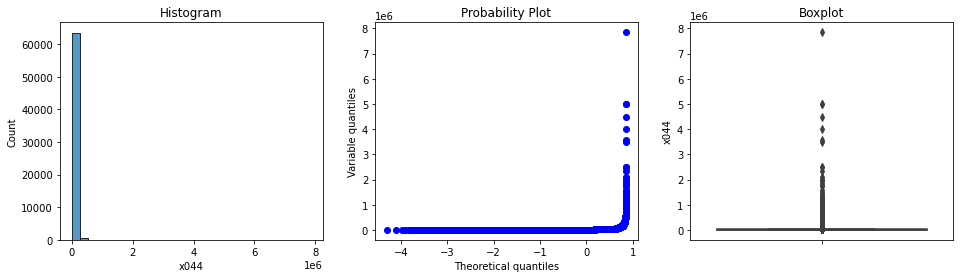

skewness of x044 is 29.20


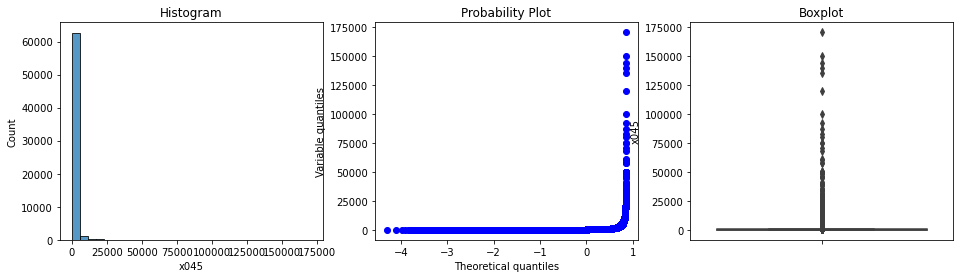

skewness of x045 is 21.56


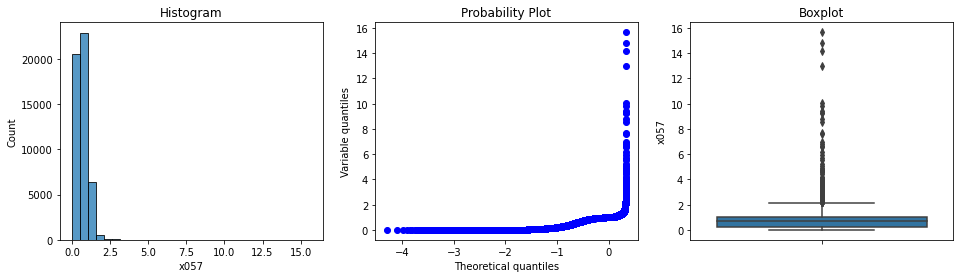

skewness of x057 is 3.29


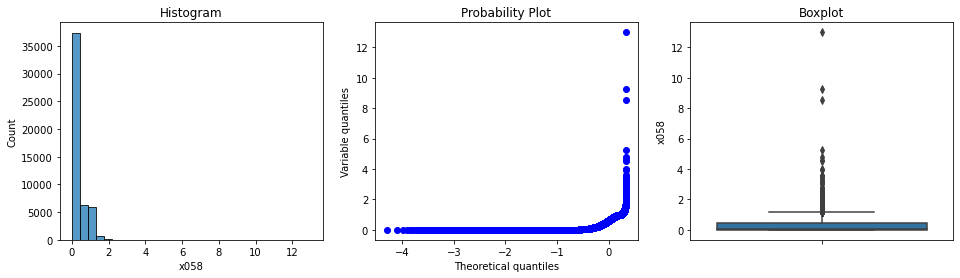

skewness of x058 is 2.51


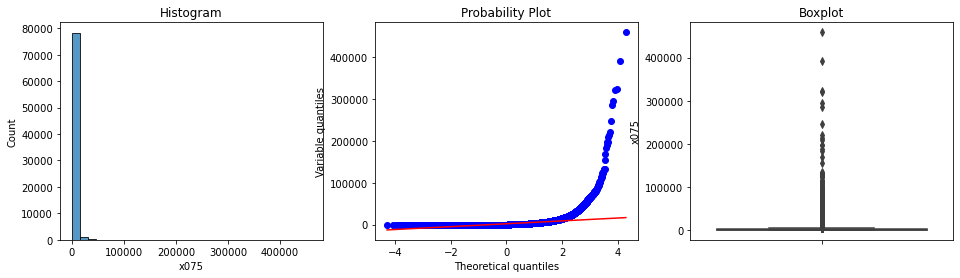

skewness of x075 is 20.32


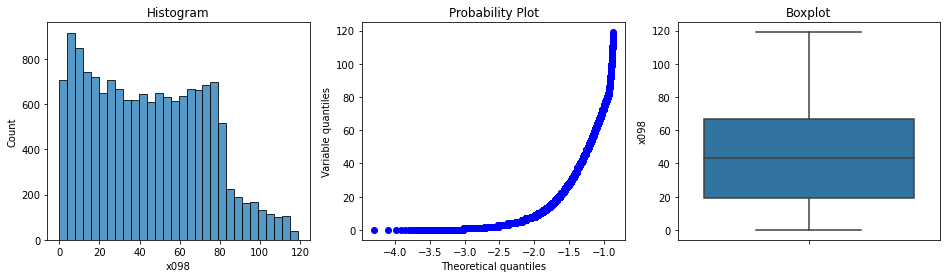

skewness of x098 is 0.29


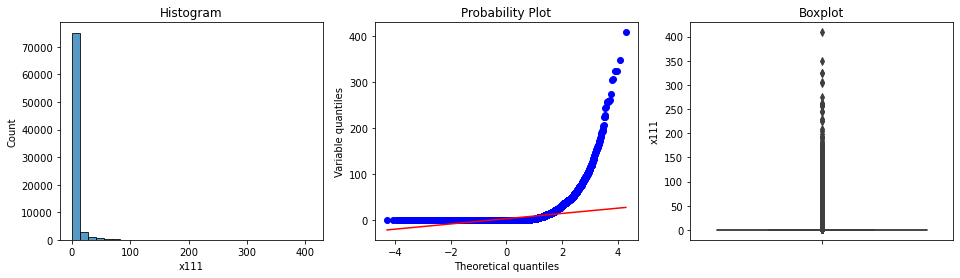

skewness of x111 is 9.73


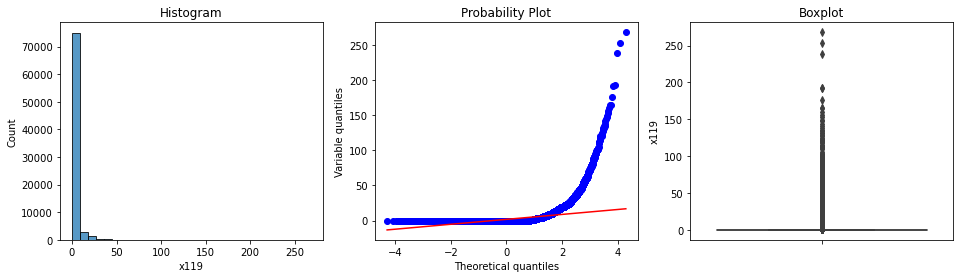

skewness of x119 is 10.26


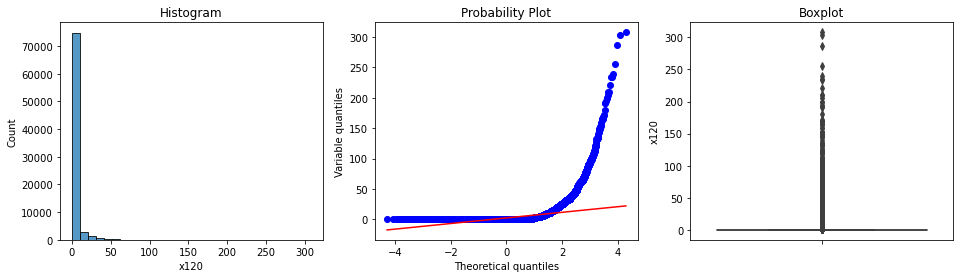

skewness of x120 is 9.89


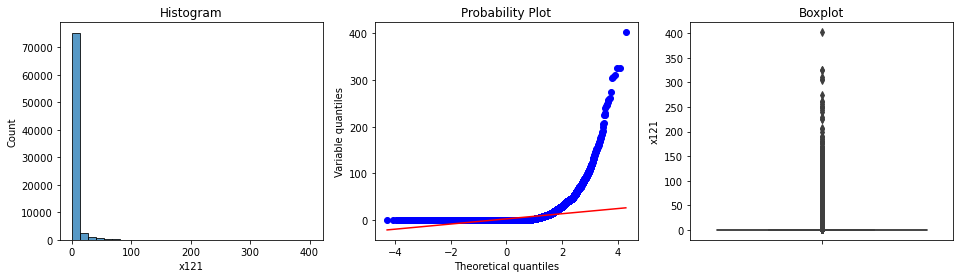

skewness of x121 is 9.93


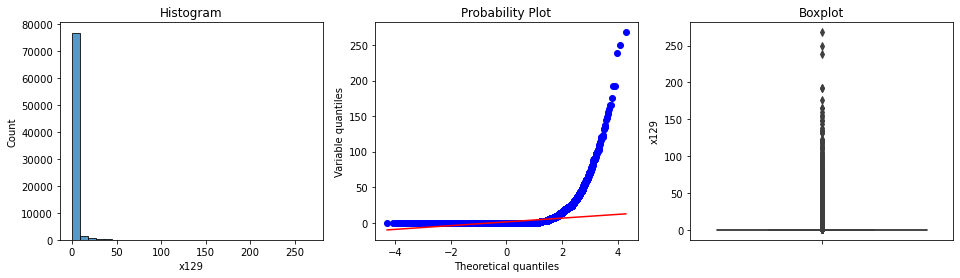

skewness of x129 is 12.91


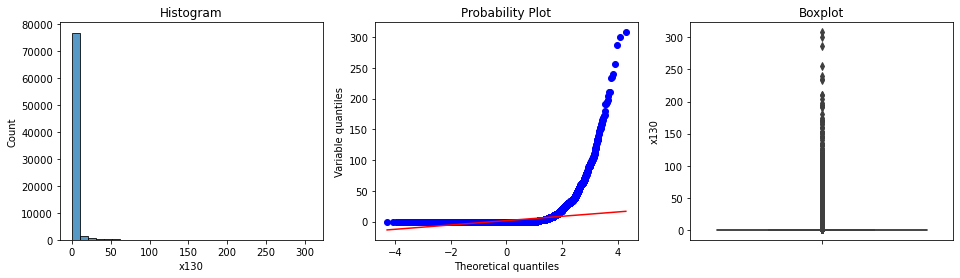

skewness of x130 is 12.19


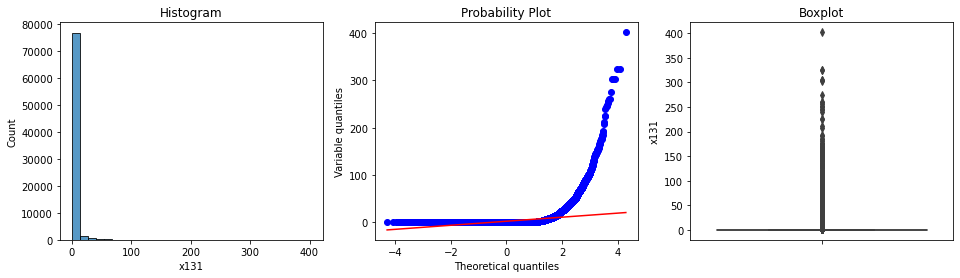

skewness of x131 is 12.08


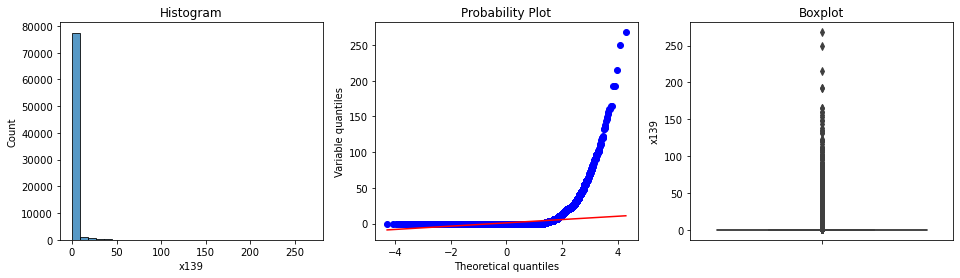

skewness of x139 is 13.78


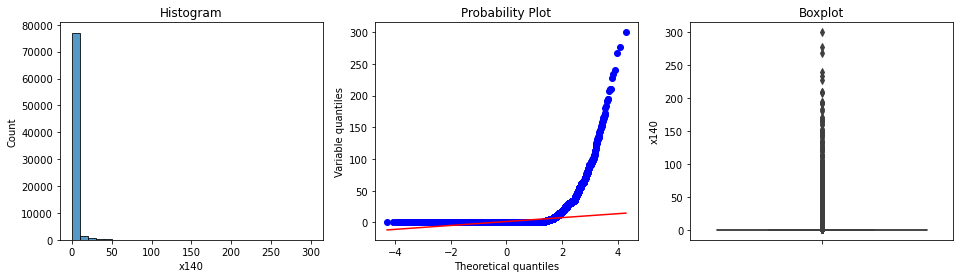

skewness of x140 is 12.72


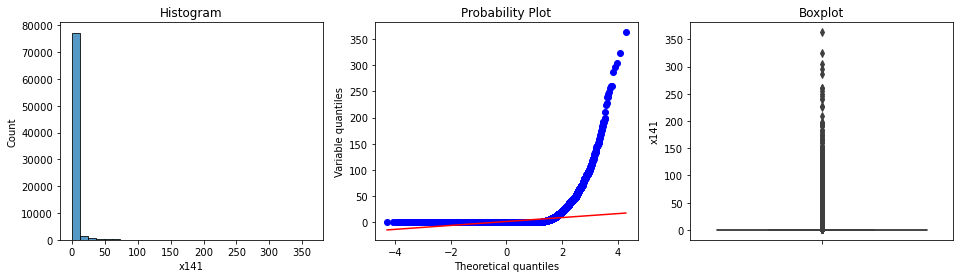

skewness of x141 is 12.44


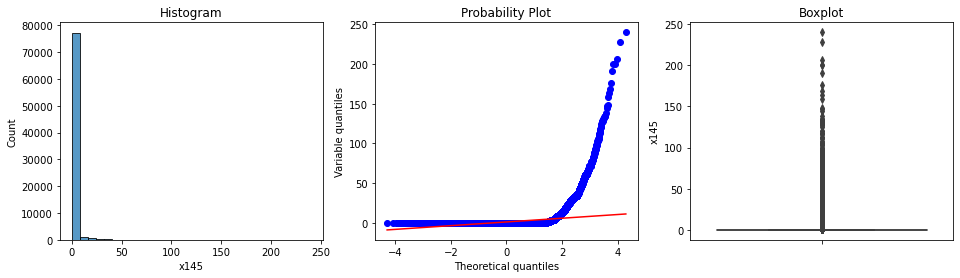

skewness of x145 is 12.85


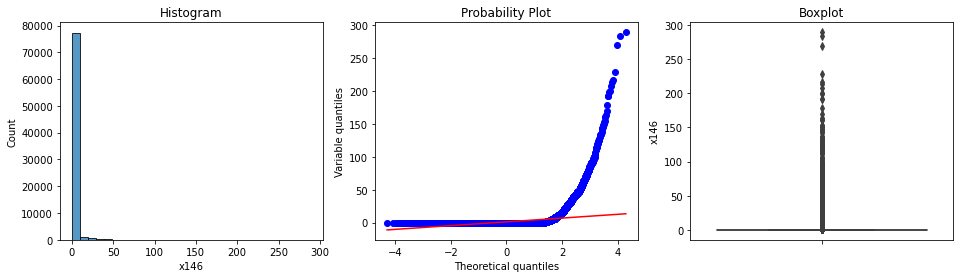

skewness of x146 is 12.55


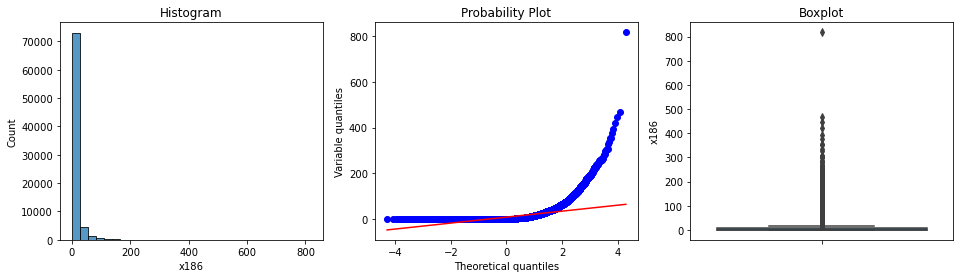

skewness of x186 is 6.32


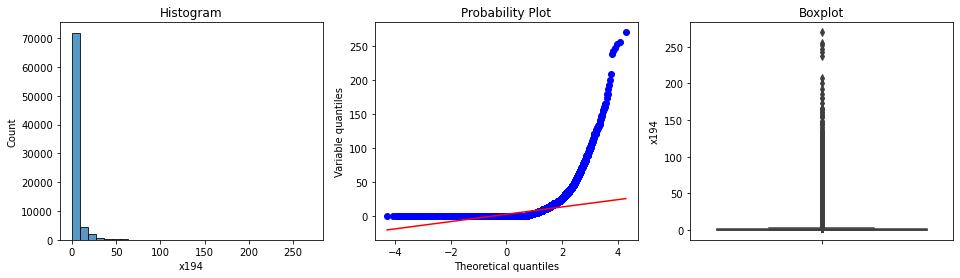

skewness of x194 is 7.97


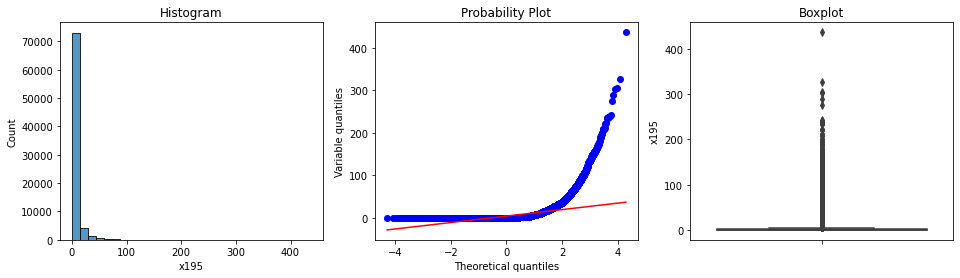

skewness of x195 is 7.39


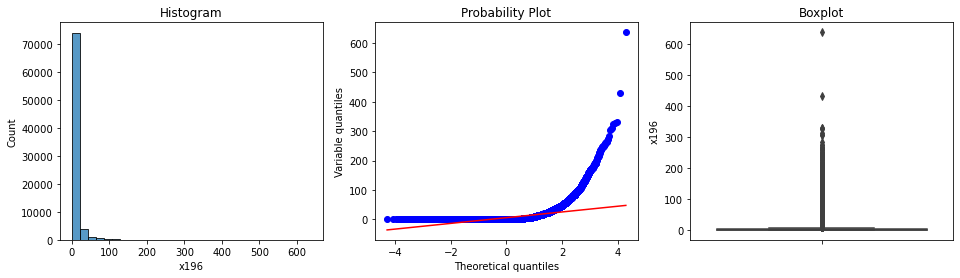

skewness of x196 is 7.22


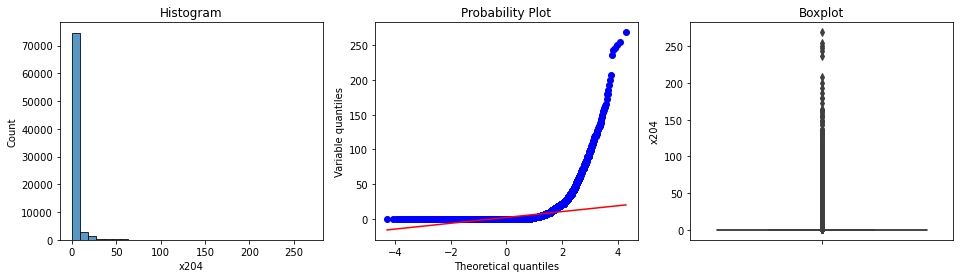

skewness of x204 is 9.85


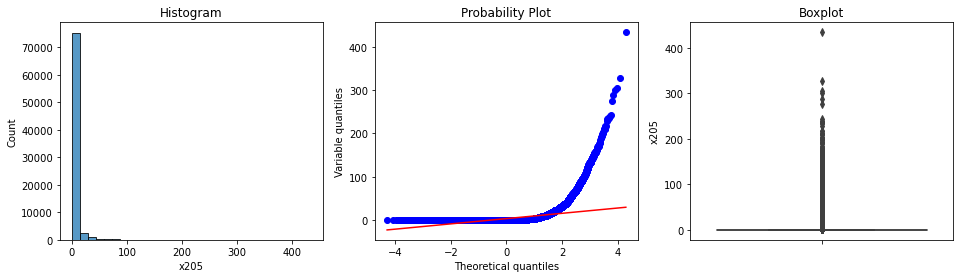

skewness of x205 is 8.93


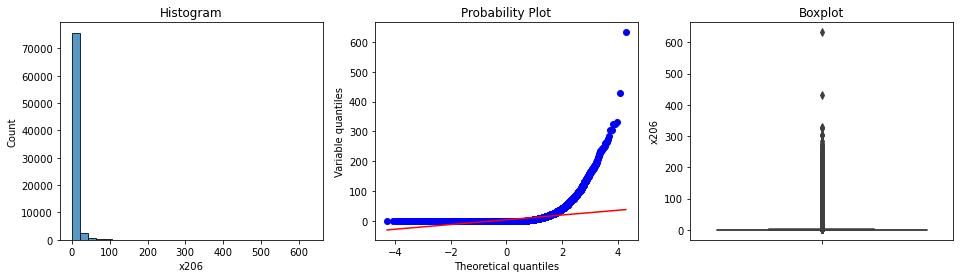

skewness of x206 is 8.65


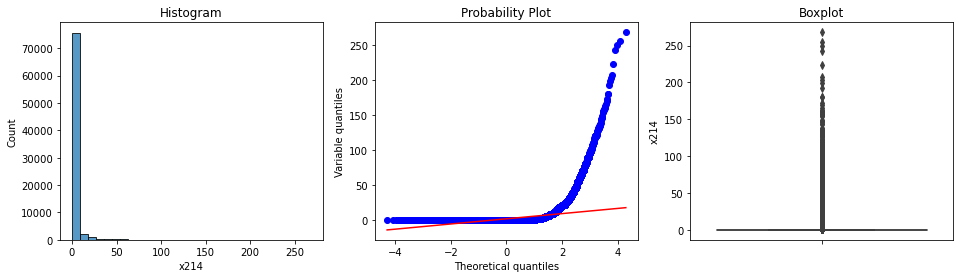

skewness of x214 is 10.57


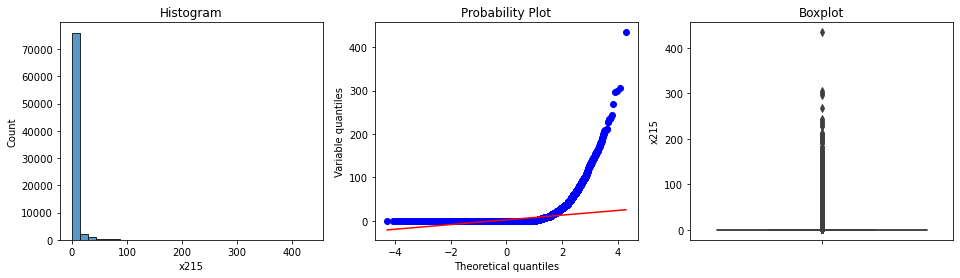

skewness of x215 is 9.46


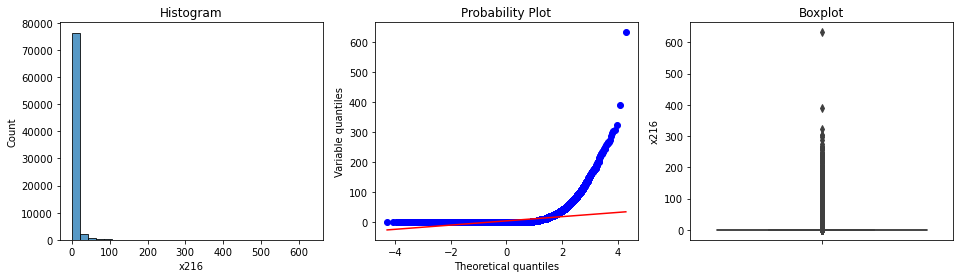

skewness of x216 is 9.17


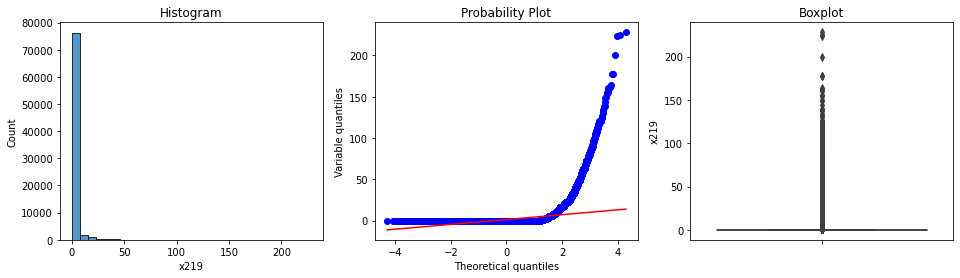

skewness of x219 is 11.06


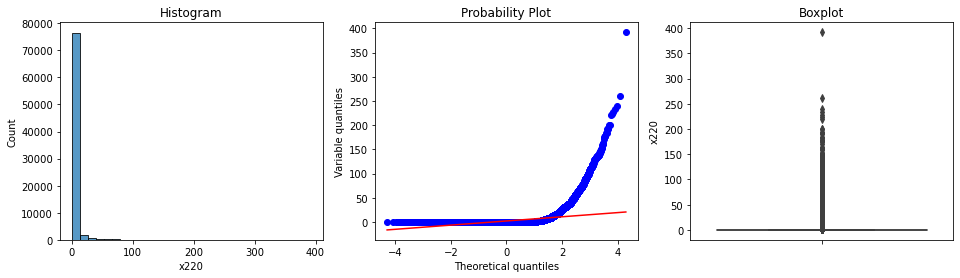

skewness of x220 is 9.81


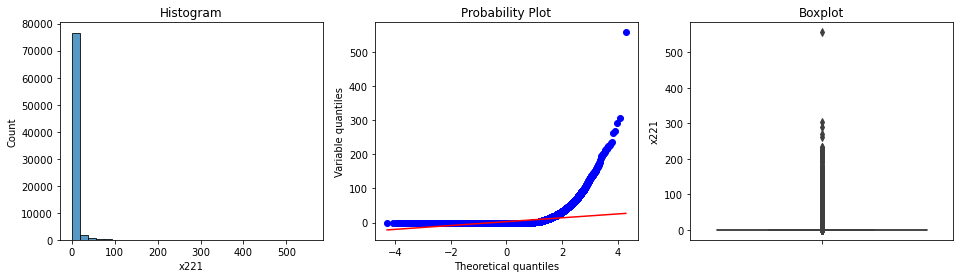

skewness of x221 is 9.48


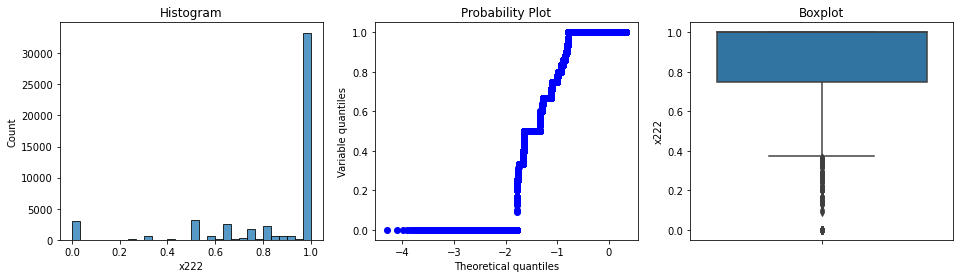

skewness of x222 is -1.96


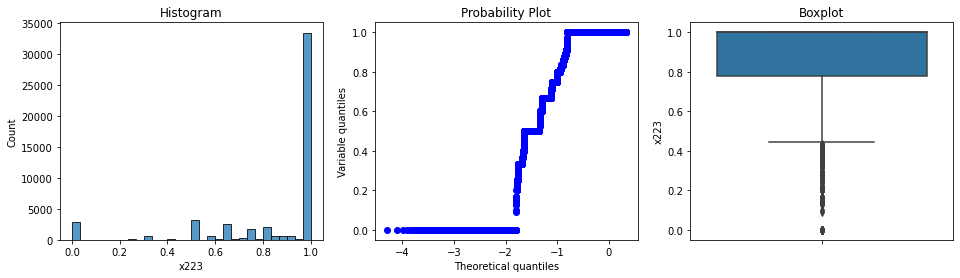

skewness of x223 is -1.98


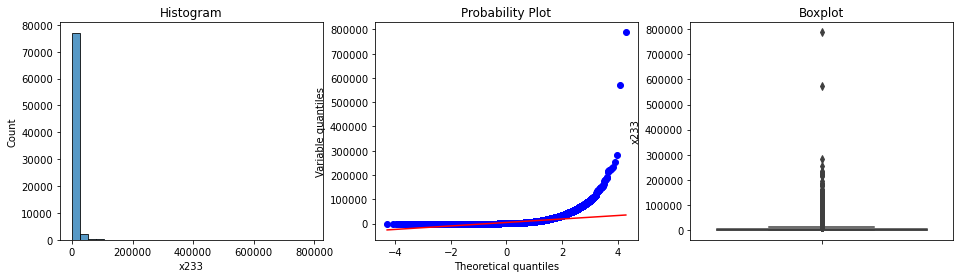

skewness of x233 is 11.69


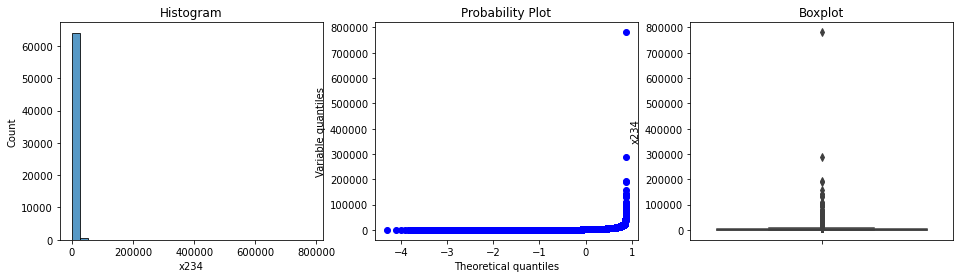

skewness of x234 is 32.63


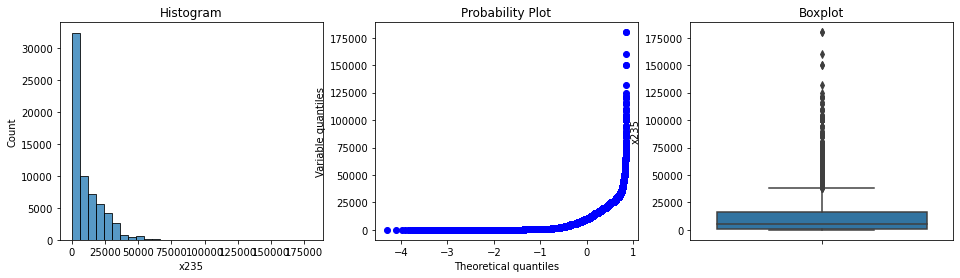

skewness of x235 is 2.03


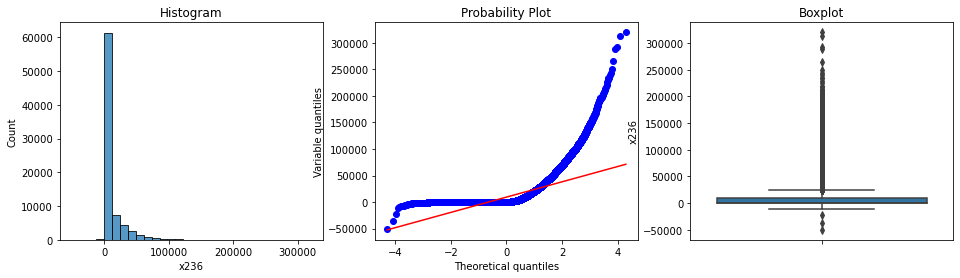

skewness of x236 is 3.51


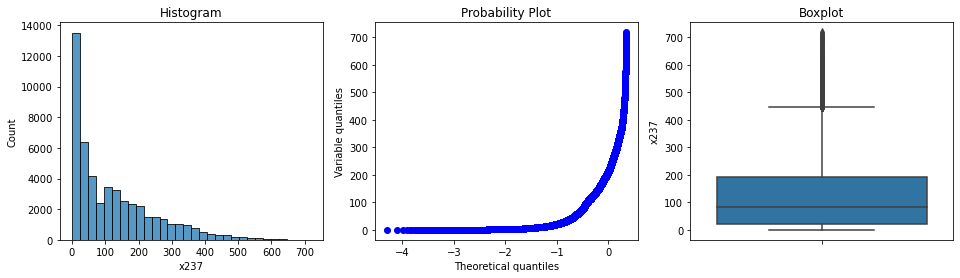

skewness of x237 is 1.25


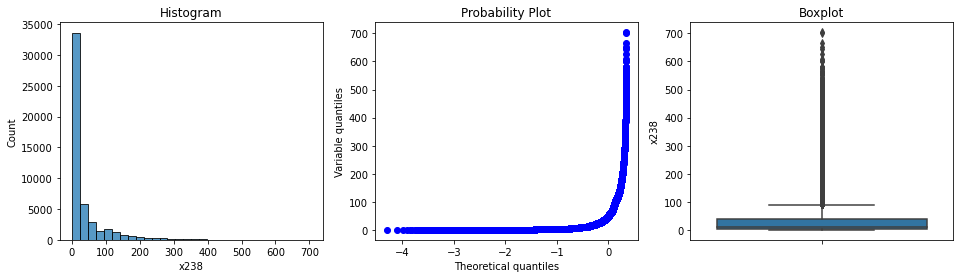

skewness of x238 is 3.11


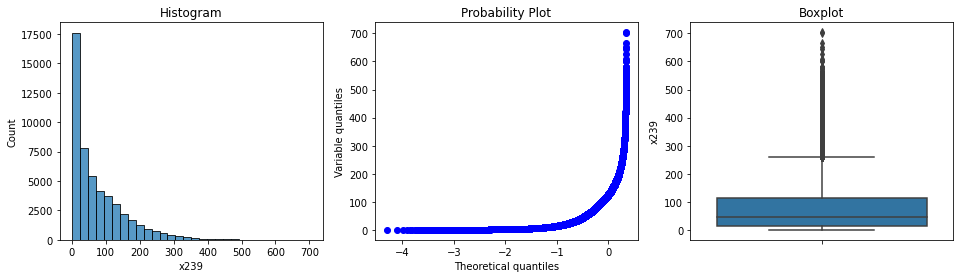

skewness of x239 is 1.74


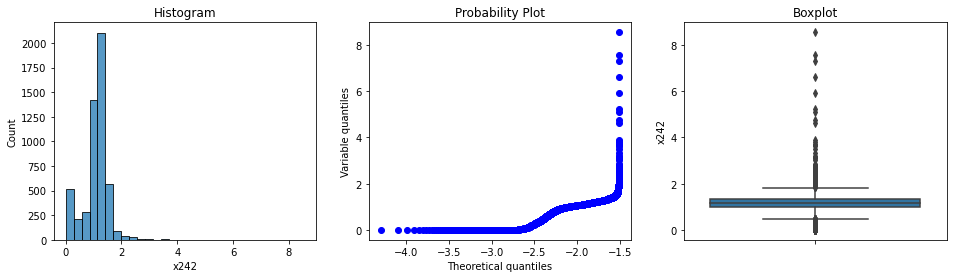

skewness of x242 is 1.72


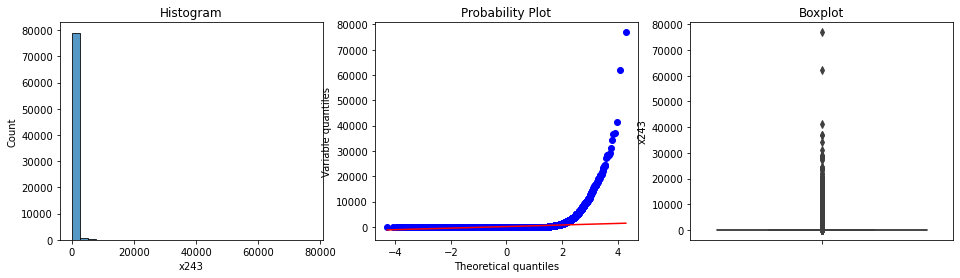

skewness of x243 is 22.55


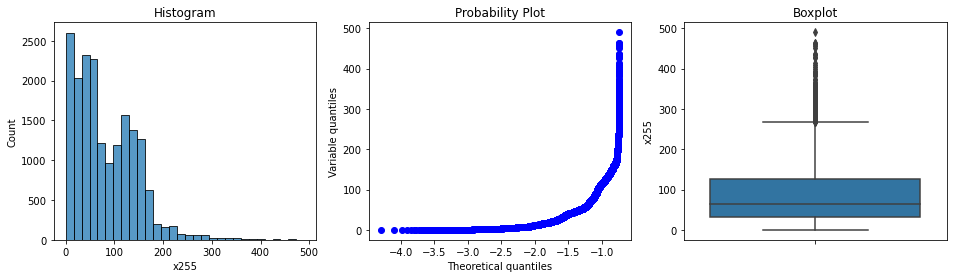

skewness of x255 is 1.04


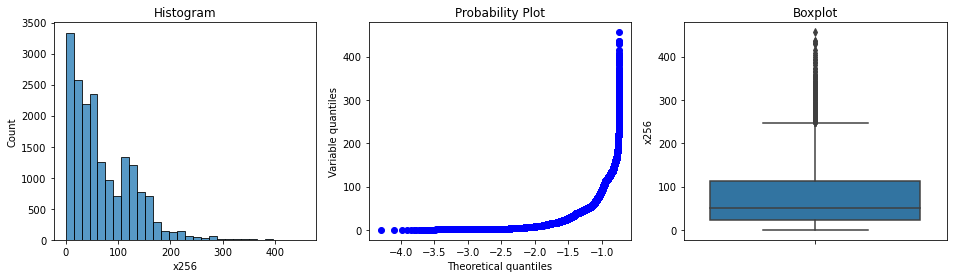

skewness of x256 is 1.24


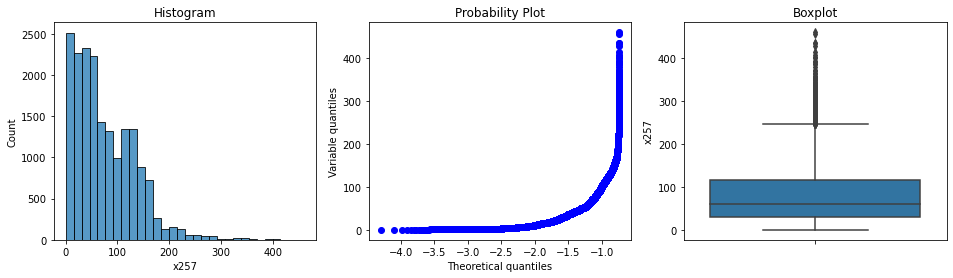

skewness of x257 is 1.13


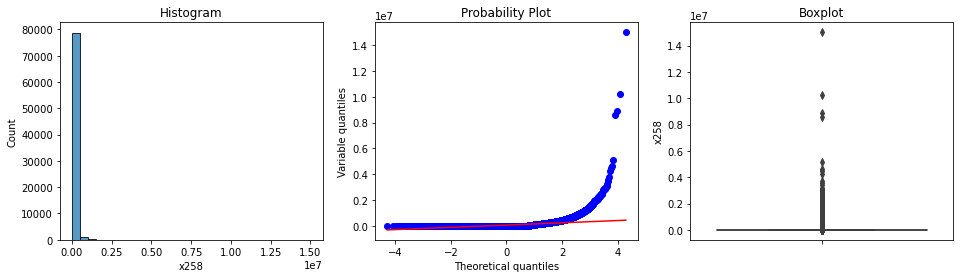

skewness of x258 is 21.54


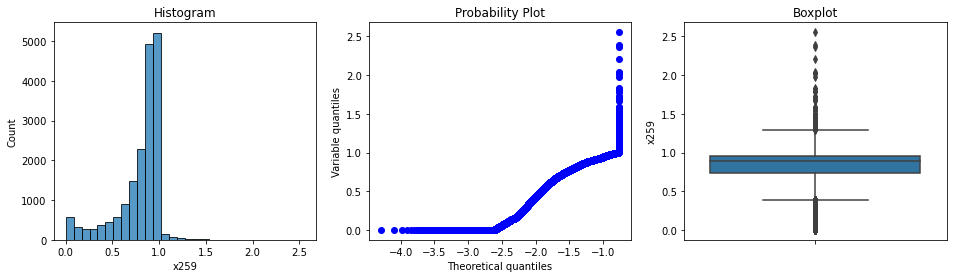

skewness of x259 is -1.48


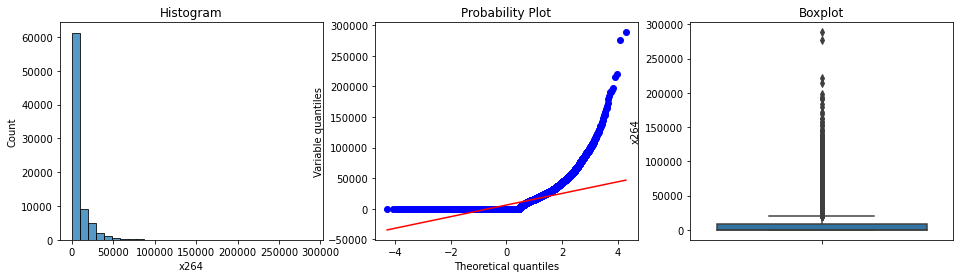

skewness of x264 is 3.71


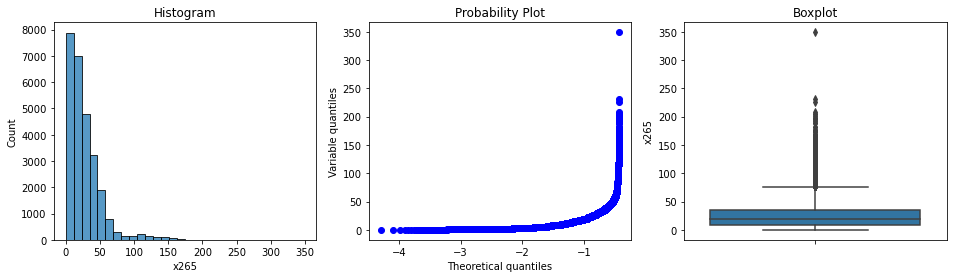

skewness of x265 is 2.38


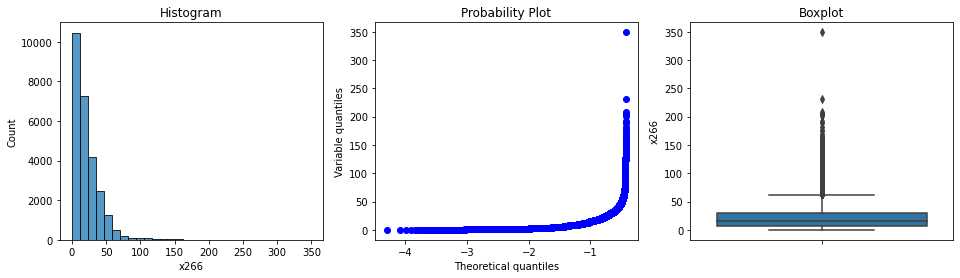

skewness of x266 is 2.67


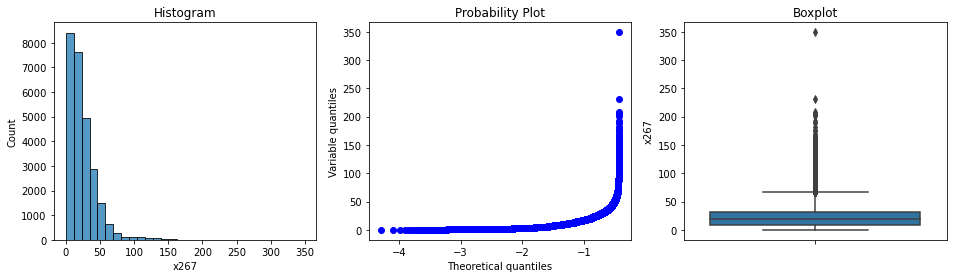

skewness of x267 is 2.42


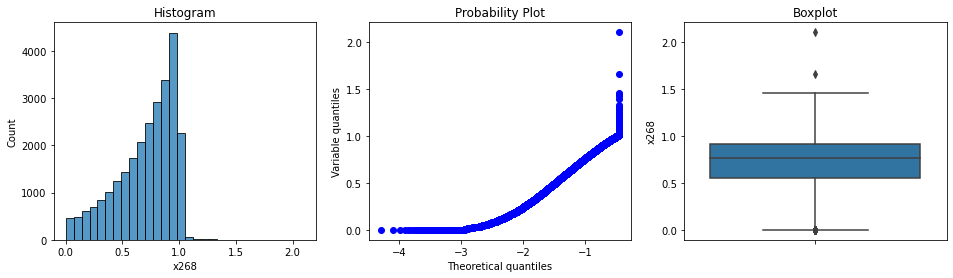

skewness of x268 is -0.84


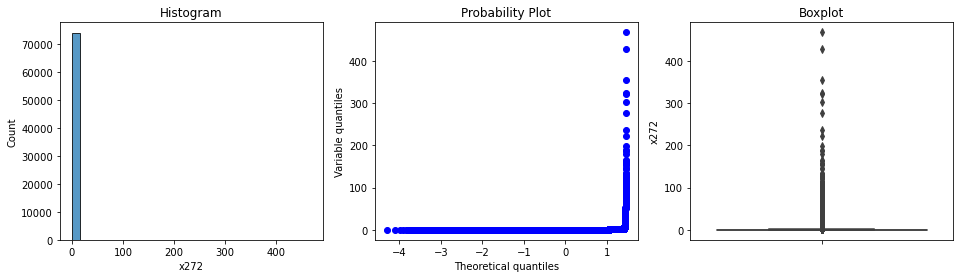

skewness of x272 is 45.18


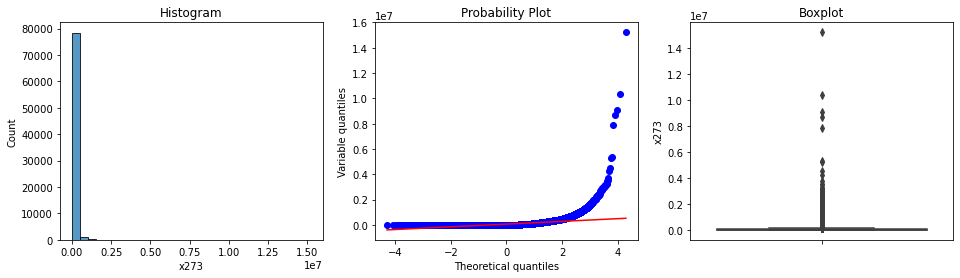

skewness of x273 is 19.11


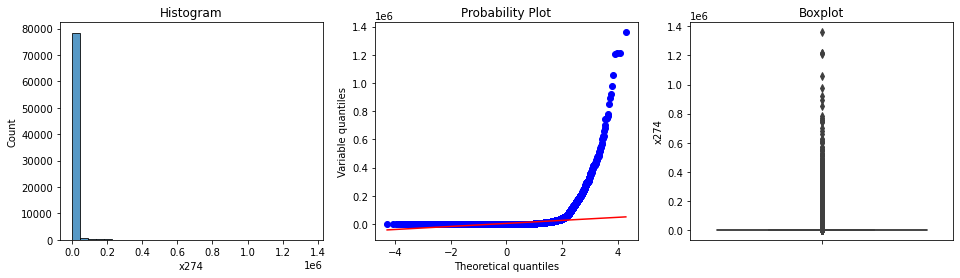

skewness of x274 is 16.73


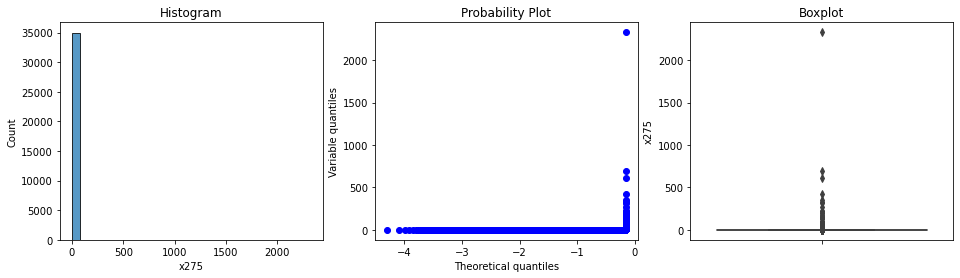

skewness of x275 is 125.87


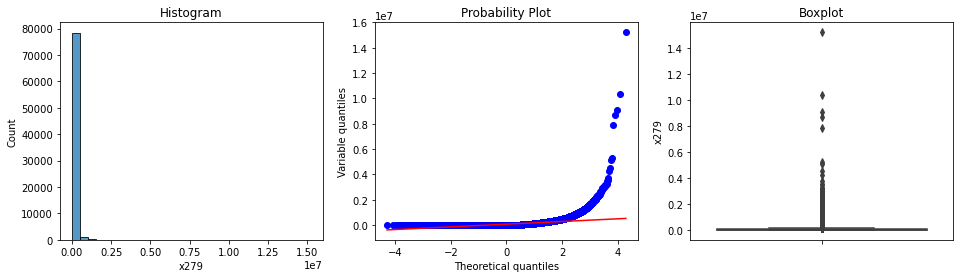

skewness of x279 is 19.29


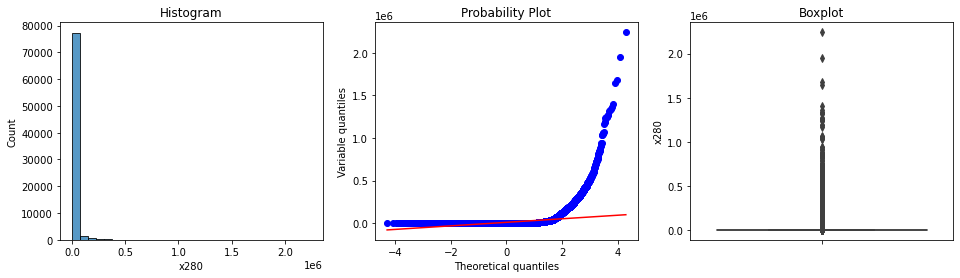

skewness of x280 is 12.99


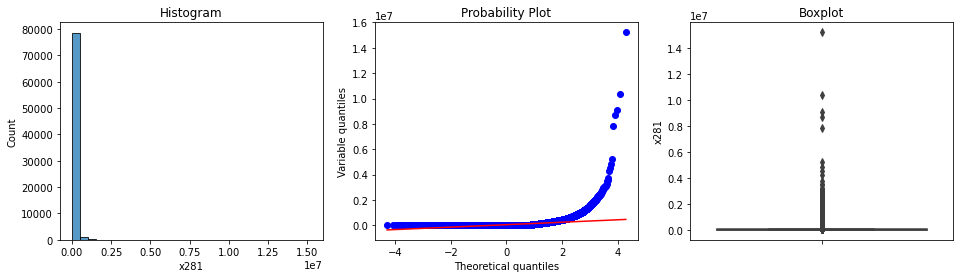

skewness of x281 is 21.19


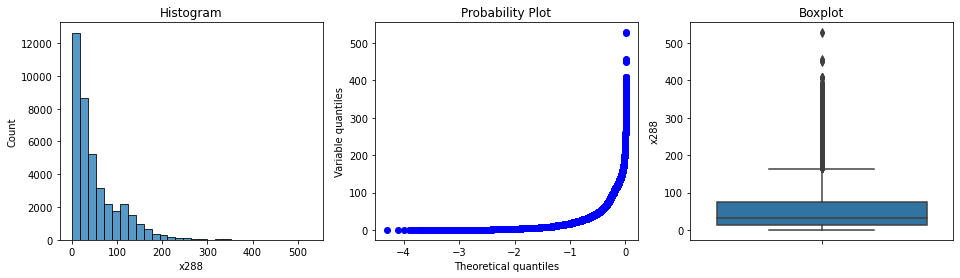

skewness of x288 is 1.76


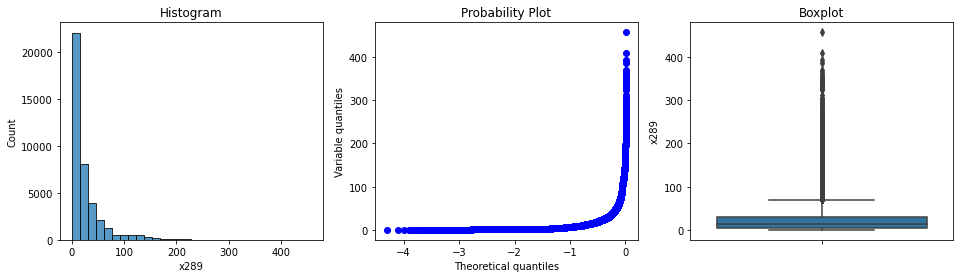

skewness of x289 is 3.16


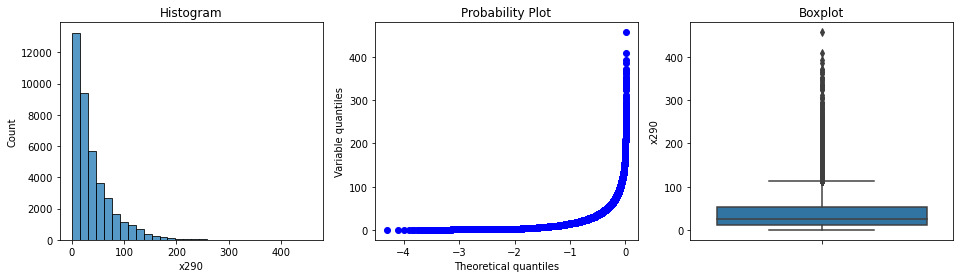

skewness of x290 is 2.18


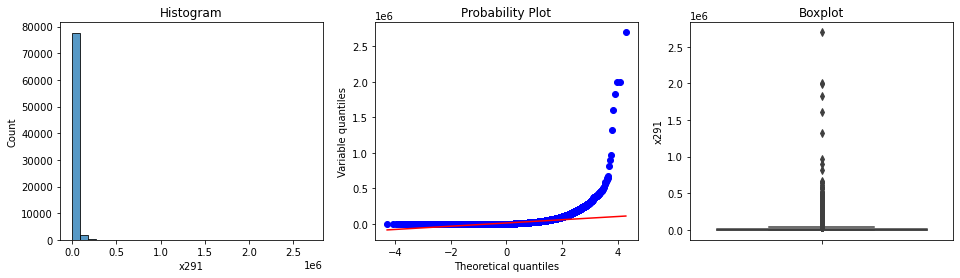

skewness of x291 is 16.71


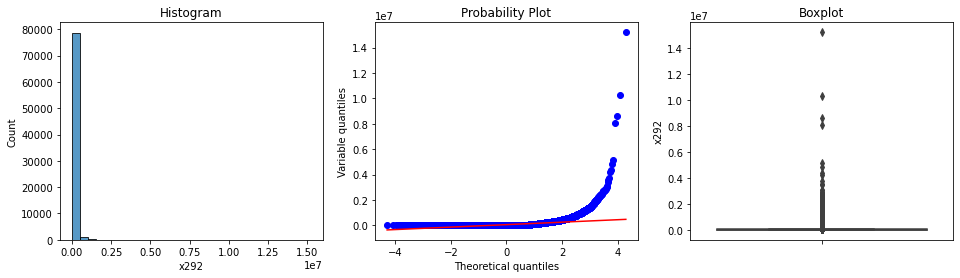

skewness of x292 is 20.89


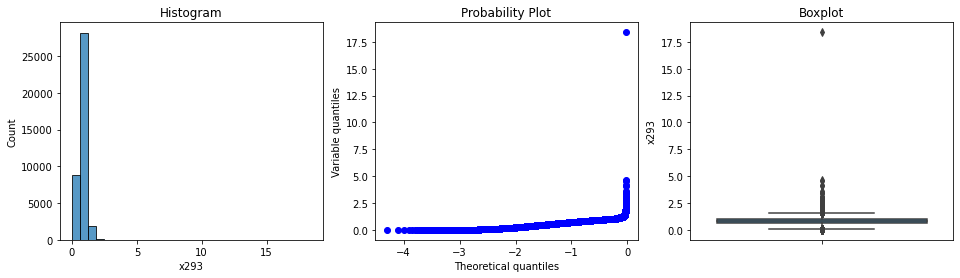

skewness of x293 is 4.56


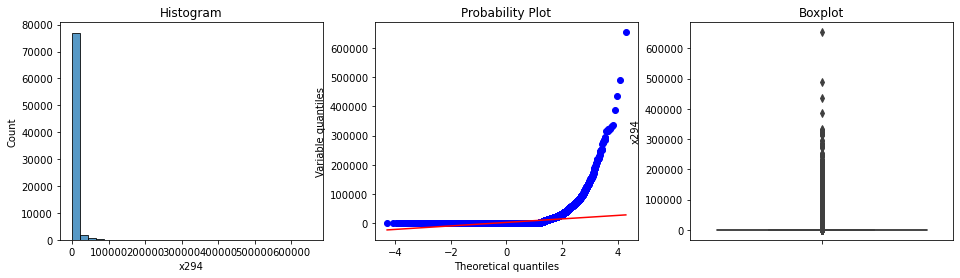

skewness of x294 is 12.08


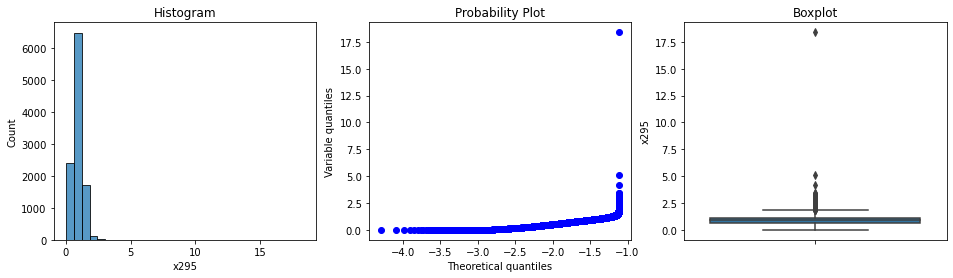

skewness of x295 is 6.49


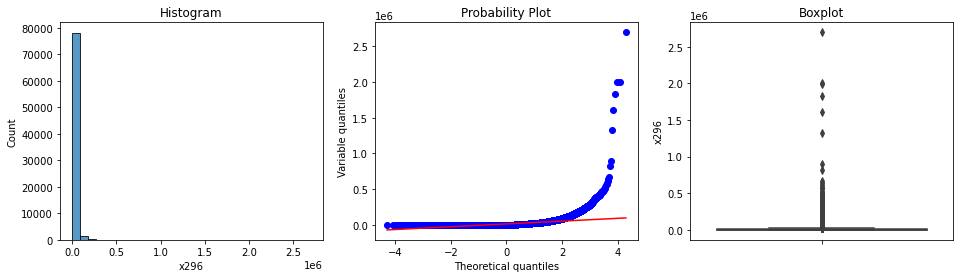

skewness of x296 is 20.28


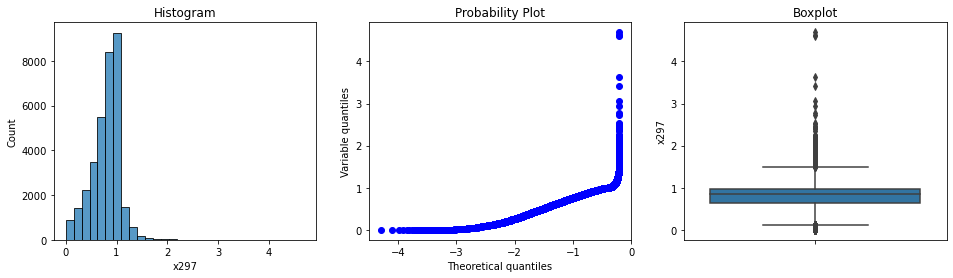

skewness of x297 is -0.05


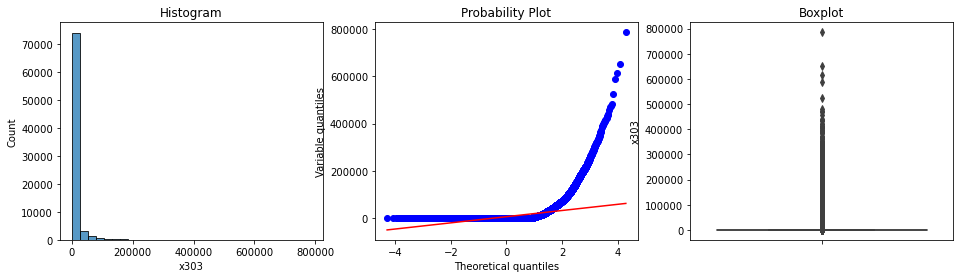

skewness of x303 is 7.68


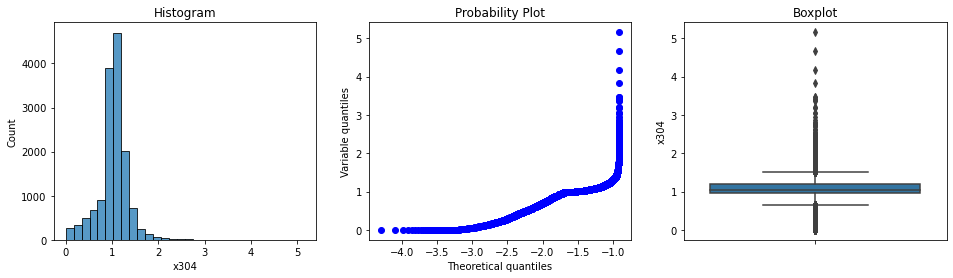

skewness of x304 is 0.27


In [25]:
# plotting the continuous variables
for variable in cont_vars:
    diagnostic_plots(df_train, variable)
    # printing skewness
    skewness = df_train[variable].skew()
    print("skewness of", variable, "is {:.2f}".format(skewness))

In [26]:
# making a list of highly skewed variables
skewed = [var for var in cont_vars if abs(df_train[var].skew()) > 4]
print('Number of highly skewed variables: ', len(skewed))

Number of highly skewed variables:  49


In [27]:
print(*skewed)

x003 x042 x043 x044 x045 x075 x111 x119 x120 x121 x129 x130 x131 x139 x140 x141 x145 x146 x186 x194 x195 x196 x204 x205 x206 x214 x215 x216 x219 x220 x221 x233 x234 x243 x258 x272 x273 x274 x275 x279 x280 x281 x291 x292 x293 x294 x295 x296 x303


In [28]:
# normally distributed and slightly skewed variables
cont_vars = [var for var in cont_vars if var not in skewed]
print('Number of continuous variables: ', len(cont_vars))

Number of continuous variables:  31


In [29]:
print(*cont_vars)

x001 x002 x004 x005 x015 x041 x057 x058 x098 x222 x223 x235 x236 x237 x238 x239 x242 x255 x256 x257 x259 x264 x265 x266 x267 x268 x288 x289 x290 x297 x304


Yeo-Johnson transformation

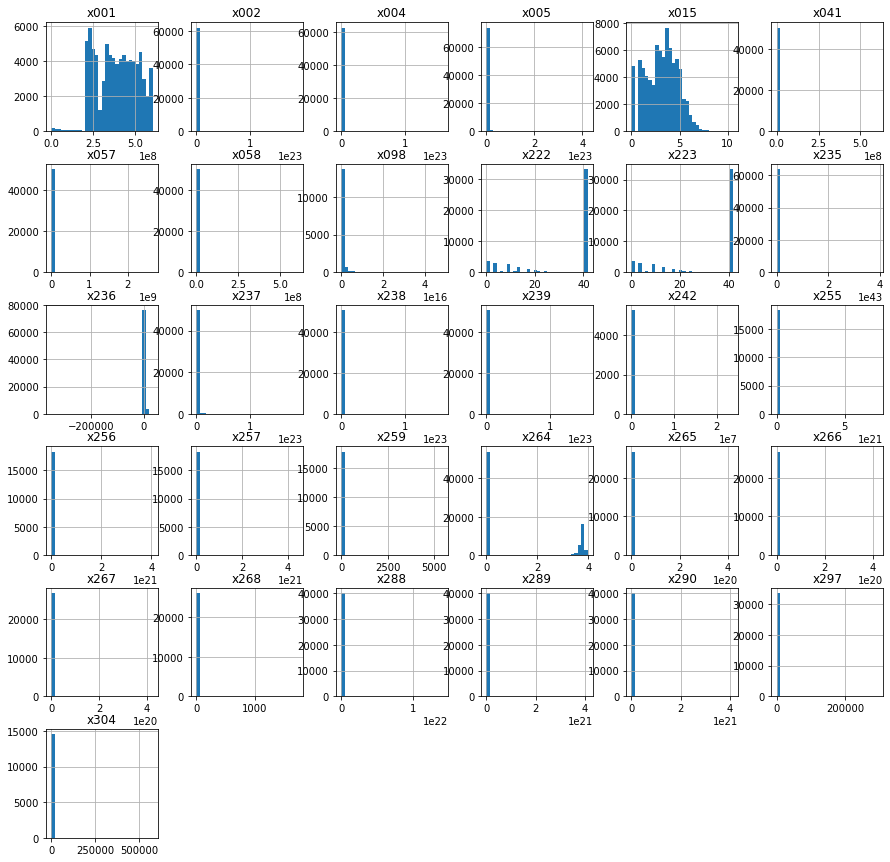

In [30]:
# Analysing the distributions of the variables after applying a yeo-johnson transformation

# temporary copy of the data
tmp = df_train.copy()

for var in cont_vars:

    # transform the variable - yeo-johsnon
    tmp[var], param = stats.yeojohnson(tmp[var])

    
# plot the histograms of the transformed variables
tmp[cont_vars].hist(bins=30, figsize=(15,15))
plt.show()

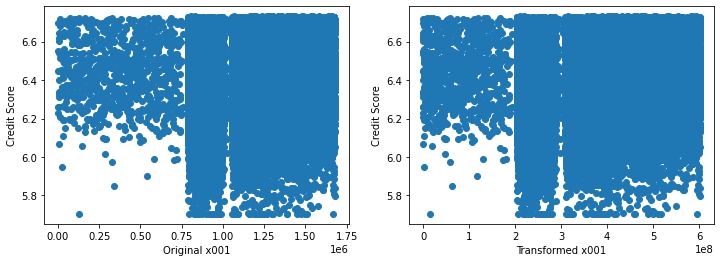

Original skewness -0.36, transformed skewness -0.10


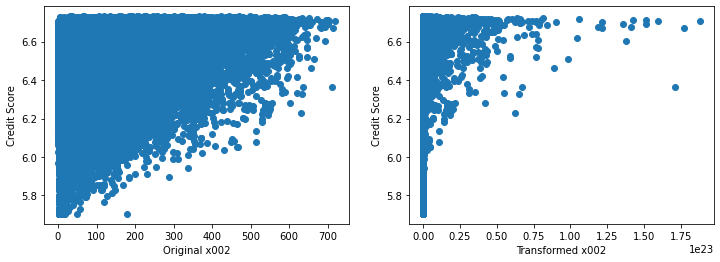

Original skewness 1.31, transformed skewness 22.46


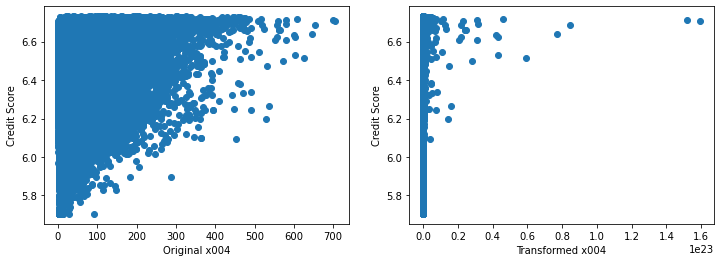

Original skewness 2.01, transformed skewness 98.50


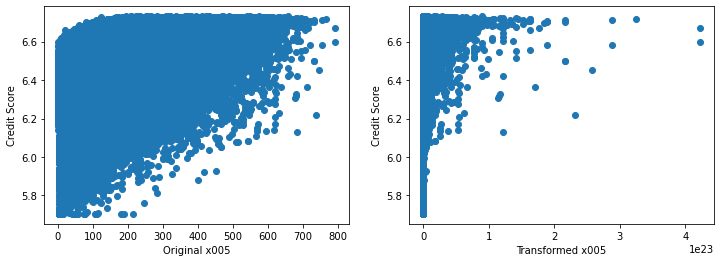

Original skewness 1.03, transformed skewness 20.97


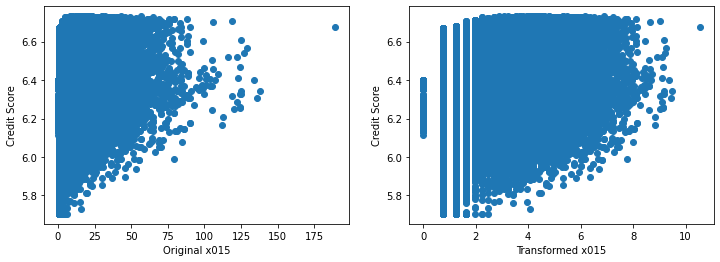

Original skewness 1.78, transformed skewness -0.05


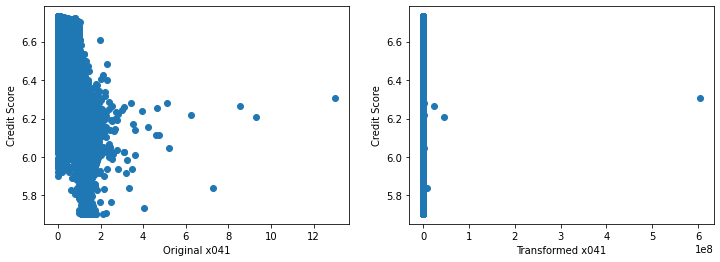

Original skewness 1.87, transformed skewness 222.40


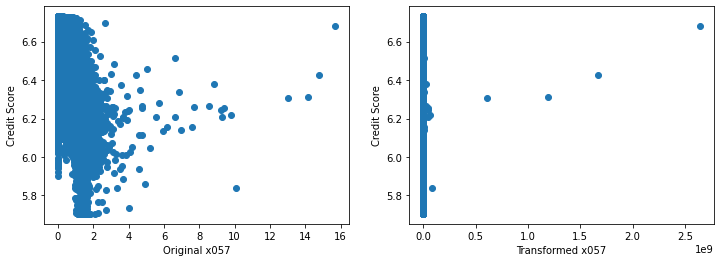

Original skewness 3.29, transformed skewness 142.84


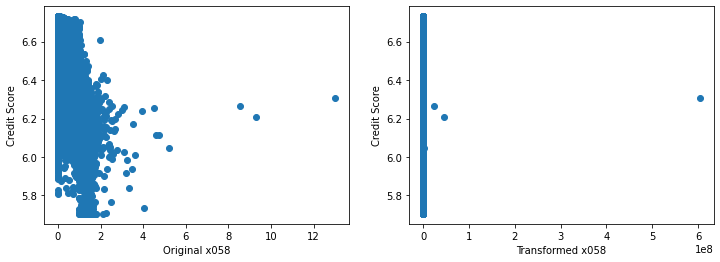

Original skewness 2.51, transformed skewness 222.45


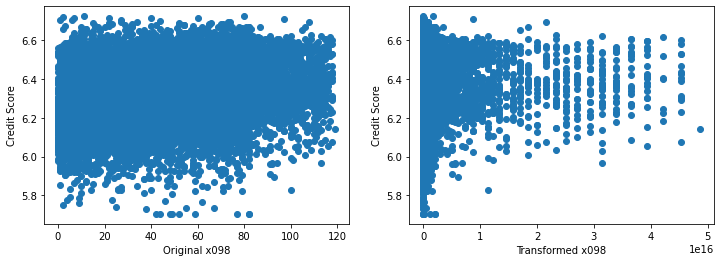

Original skewness 0.29, transformed skewness 5.94


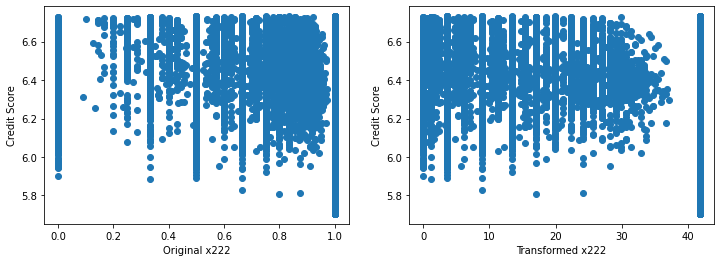

Original skewness -1.96, transformed skewness -0.92


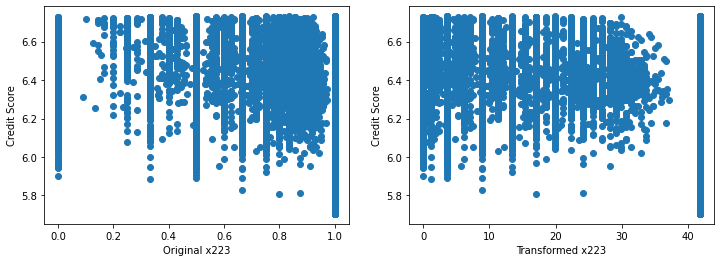

Original skewness -1.98, transformed skewness -0.94


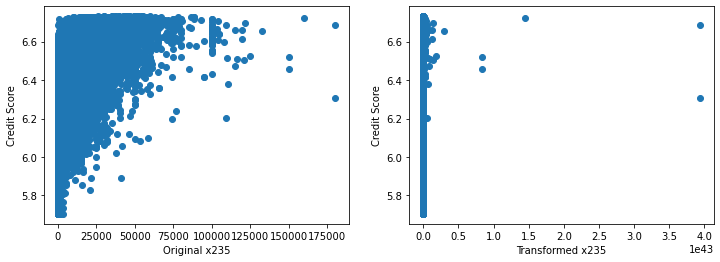

Original skewness 2.03, transformed skewness 155.69


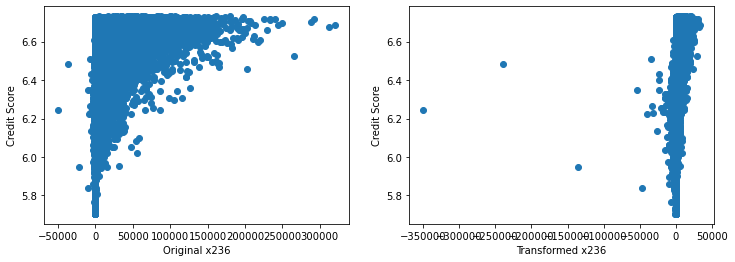

Original skewness 3.51, transformed skewness -21.72


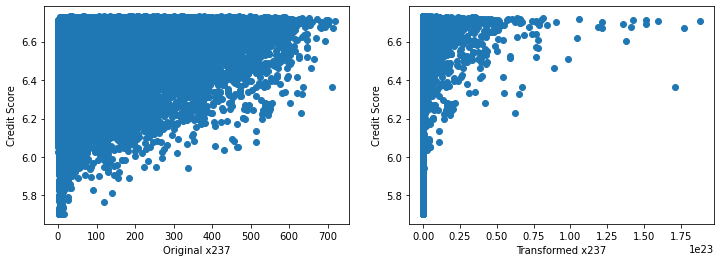

Original skewness 1.25, transformed skewness 20.42


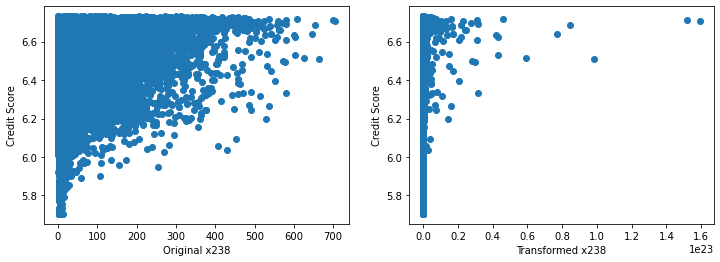

Original skewness 3.11, transformed skewness 75.53


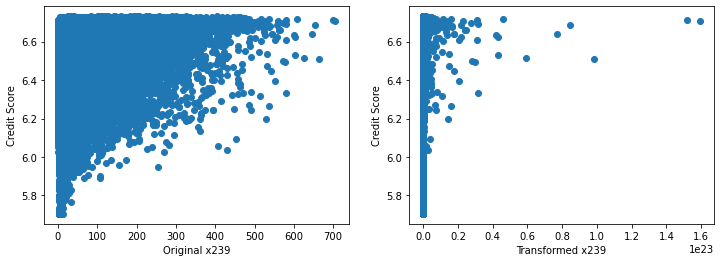

Original skewness 1.74, transformed skewness 73.99


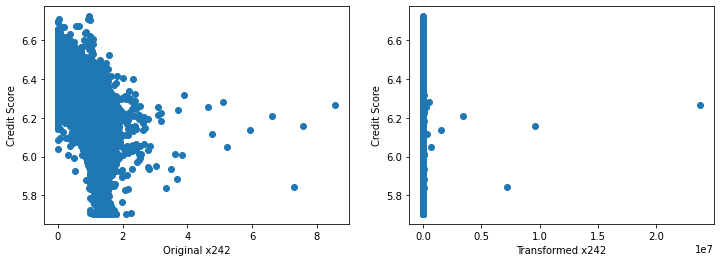

Original skewness 1.72, transformed skewness 54.99


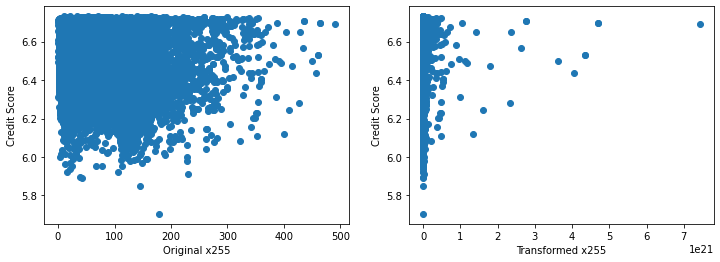

Original skewness 1.04, transformed skewness 40.01


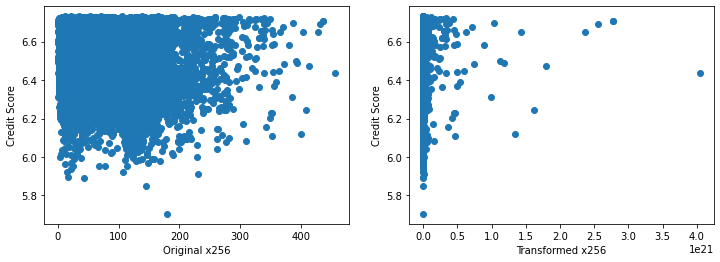

Original skewness 1.24, transformed skewness 40.72


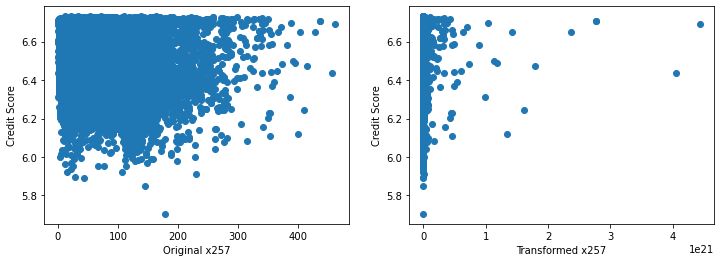

Original skewness 1.13, transformed skewness 44.51


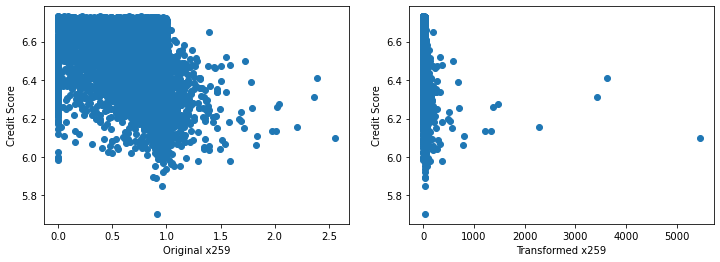

Original skewness -1.48, transformed skewness 55.55


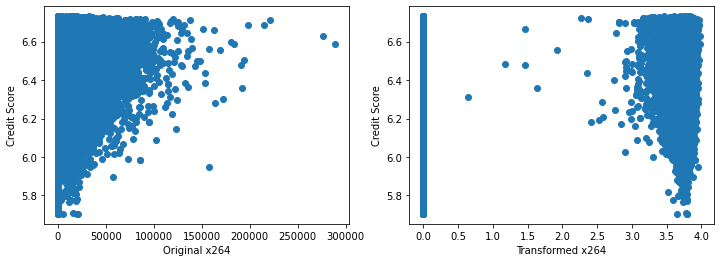

Original skewness 3.71, transformed skewness 0.75


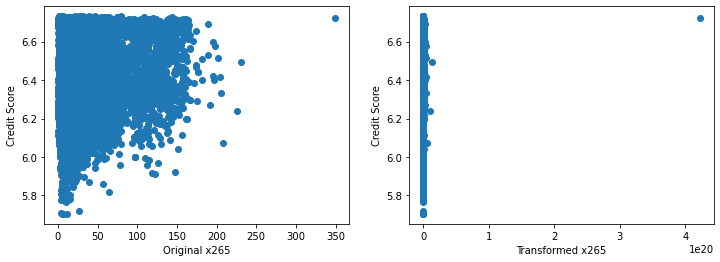

Original skewness 2.38, transformed skewness 162.98


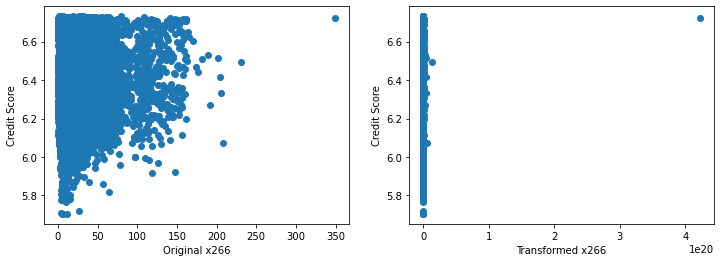

Original skewness 2.67, transformed skewness 163.25


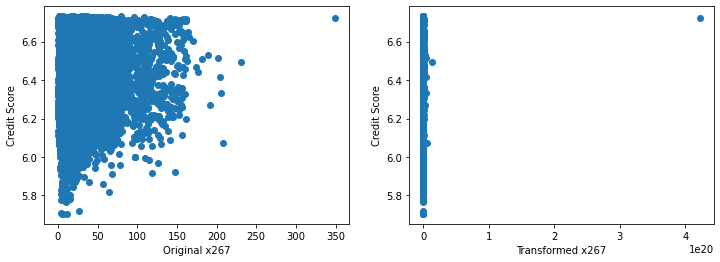

Original skewness 2.42, transformed skewness 163.25


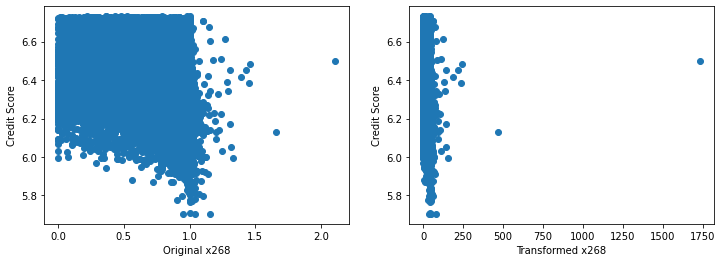

Original skewness -0.84, transformed skewness 34.66


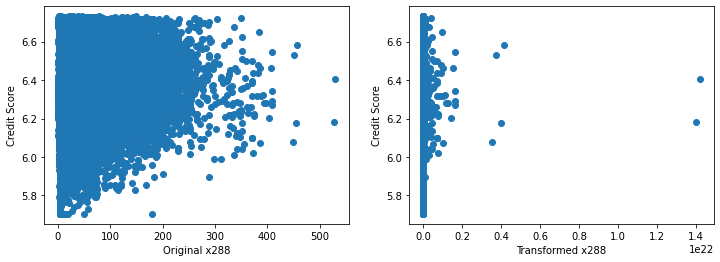

Original skewness 1.76, transformed skewness 106.39


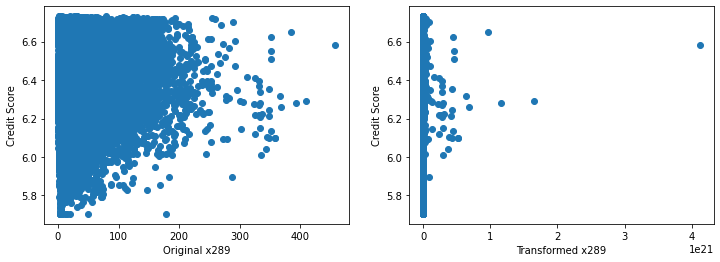

Original skewness 3.16, transformed skewness 115.74


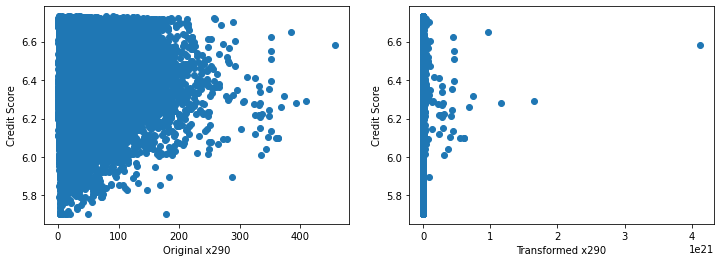

Original skewness 2.18, transformed skewness 112.41


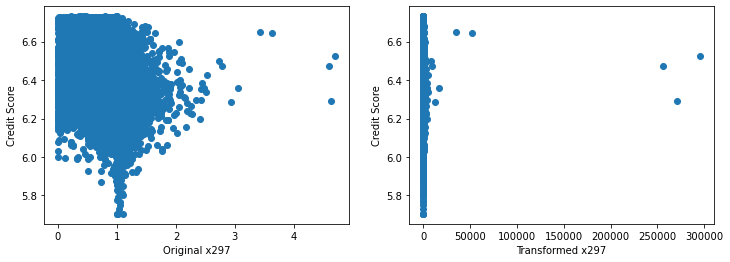

Original skewness -0.05, transformed skewness 103.34


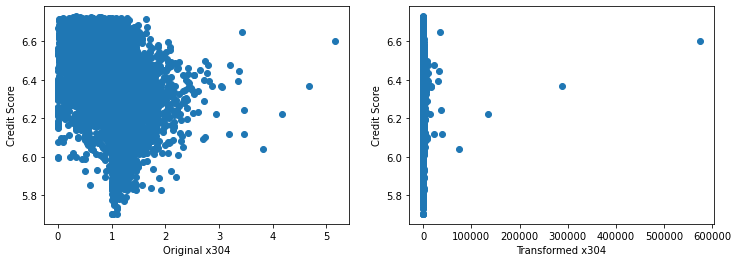

Original skewness 0.27, transformed skewness 87.80


In [31]:
# plotting the original or transformed variables vs credit score and seeing if there is a relationship

for var in cont_vars:
    
    plt.figure(figsize=(12,4))
    
    # plot the original variable vs sale price    
    plt.subplot(1, 2, 1)
    plt.scatter(df_train[var], np.log(df_train.y))
    plt.ylabel('Credit Score')
    plt.xlabel('Original ' + var)

    # plot transformed variable vs sale price
    plt.subplot(1, 2, 2)
    plt.scatter(tmp[var], np.log(df_train.y))
    plt.ylabel('Credit Score')
    plt.xlabel('Transformed ' + var)
                
    plt.show()
    print('Original skewness {:.2f}, transformed skewness {:.2f}'.format(df_train[var].skew(), tmp[var].skew()))


Yeo-Johnson transformation improved predectibility of x001, x015, x222, x223, x264

Square root transformation

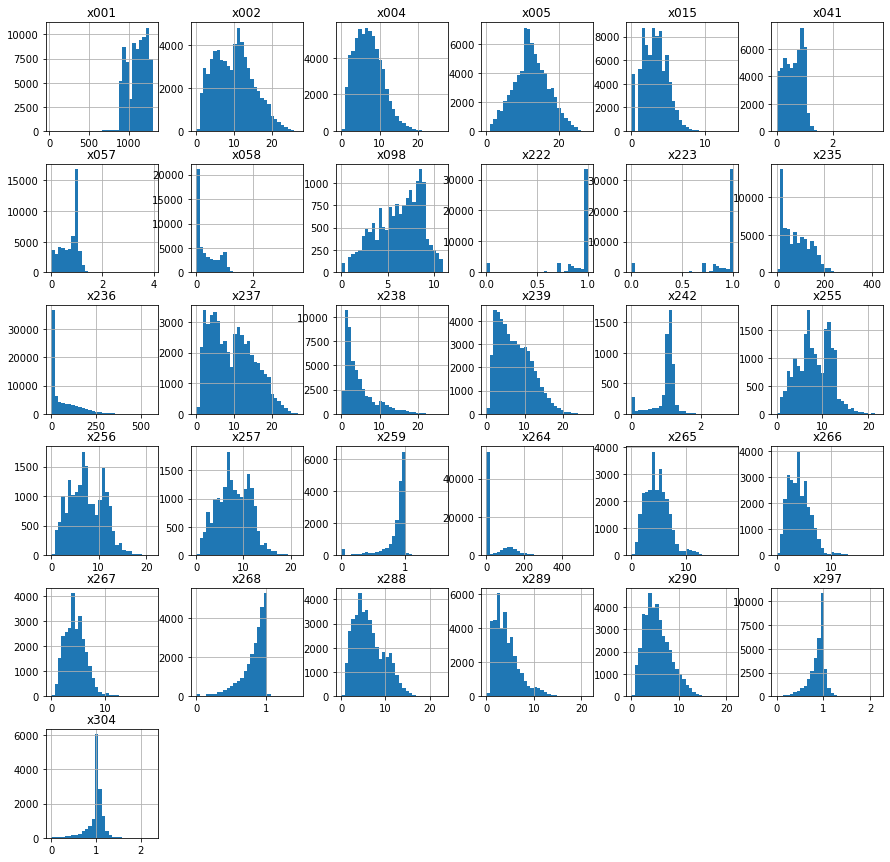

In [32]:
# Analysing the distributions of the variables after applying a square root transformation

# temporary copy of the data
tmp = df_train.copy()

for var in cont_vars:

    # transform the variable - yeo-johsnon
    tmp[var] = np.sqrt(tmp[var])

    
# plot the histograms of the transformed variables
tmp[cont_vars].hist(bins=30, figsize=(15,15))
plt.show()

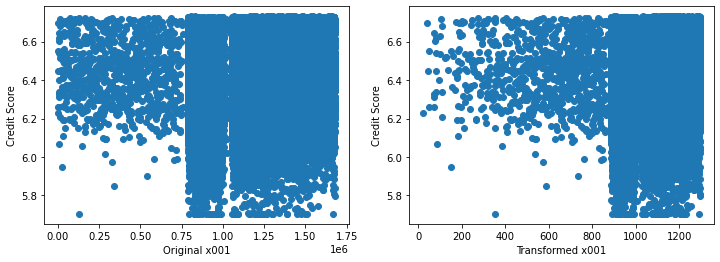

Original skewness -0.36, transformed skewness -1.04


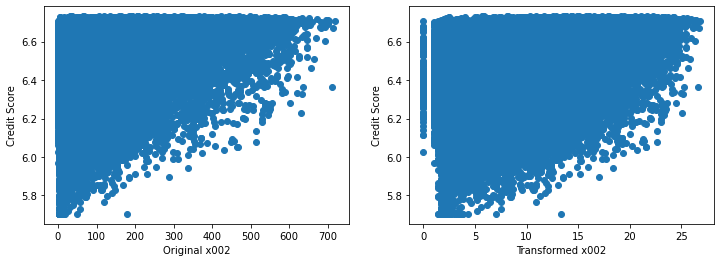

Original skewness 1.31, transformed skewness 0.32


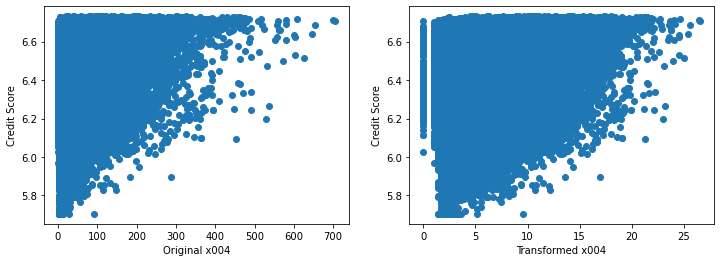

Original skewness 2.01, transformed skewness 0.60


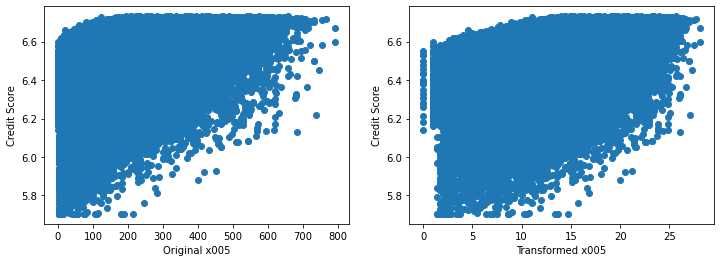

Original skewness 1.03, transformed skewness 0.09


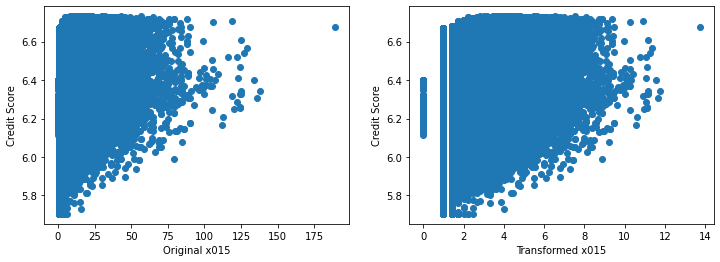

Original skewness 1.78, transformed skewness 0.21


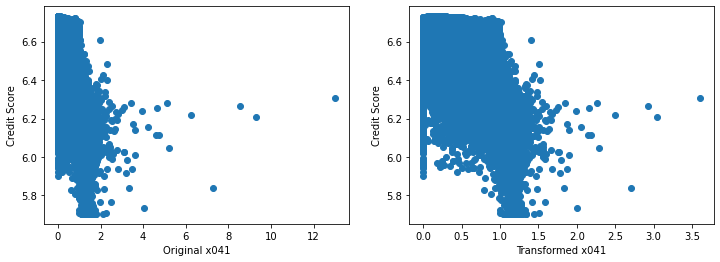

Original skewness 1.87, transformed skewness -0.10


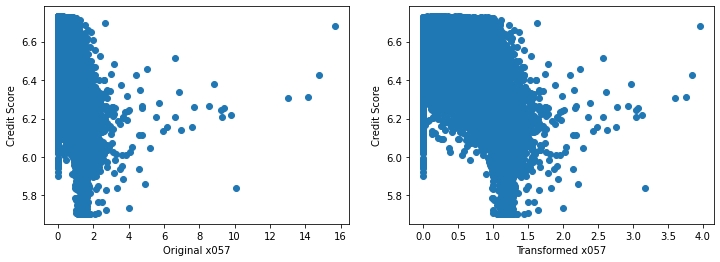

Original skewness 3.29, transformed skewness -0.44


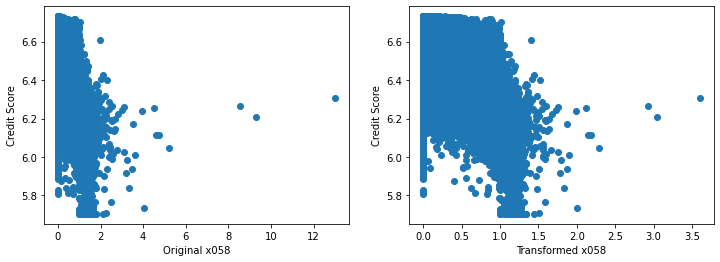

Original skewness 2.51, transformed skewness 0.73


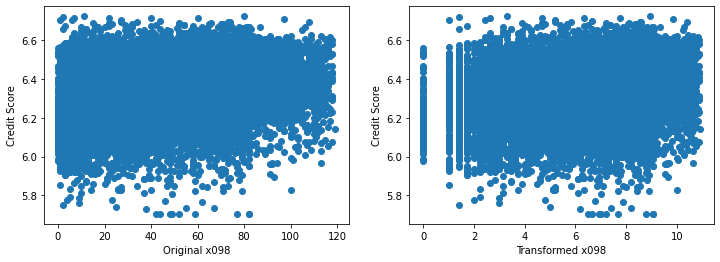

Original skewness 0.29, transformed skewness -0.37


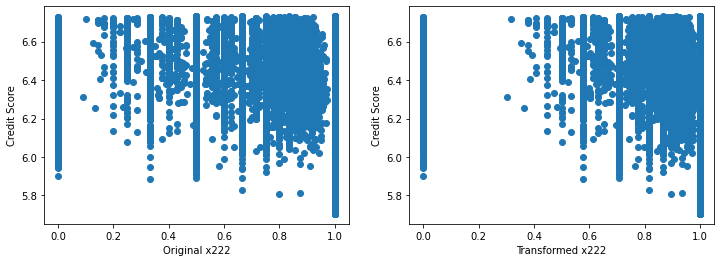

Original skewness -1.96, transformed skewness -2.84


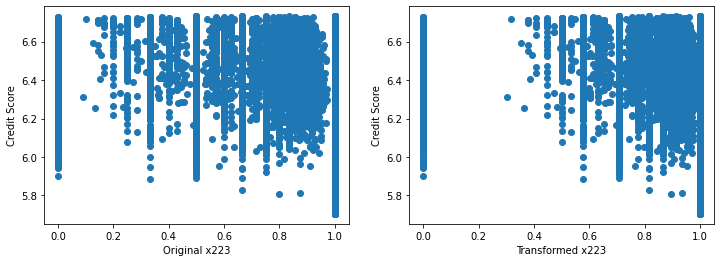

Original skewness -1.98, transformed skewness -2.86


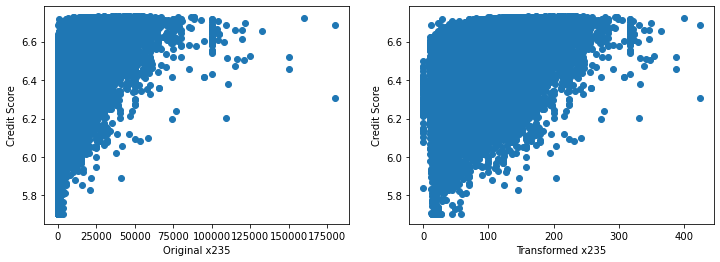

Original skewness 2.03, transformed skewness 0.60


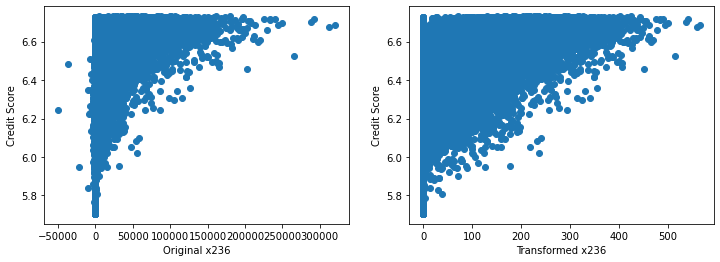

Original skewness 3.51, transformed skewness 1.39


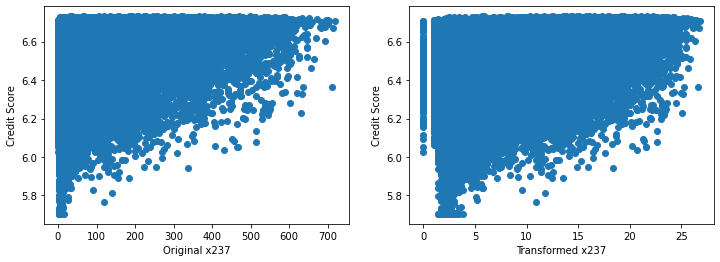

Original skewness 1.25, transformed skewness 0.38


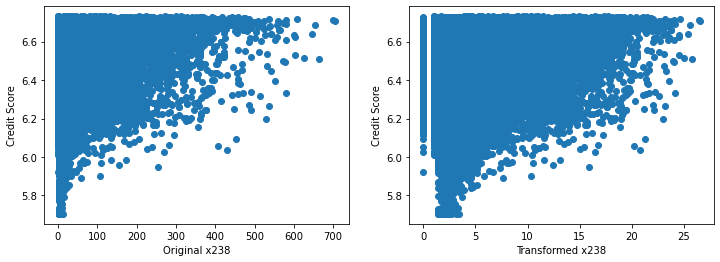

Original skewness 3.11, transformed skewness 1.52


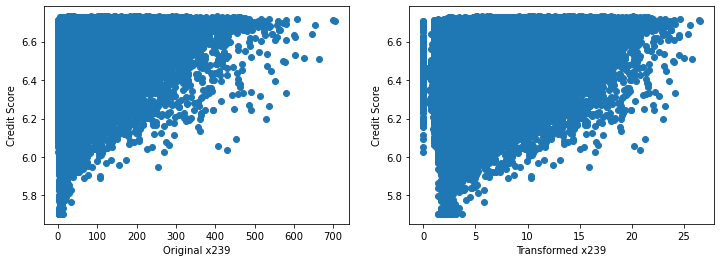

Original skewness 1.74, transformed skewness 0.61


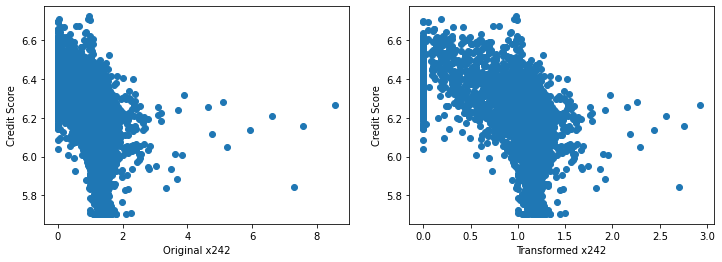

Original skewness 1.72, transformed skewness -1.62


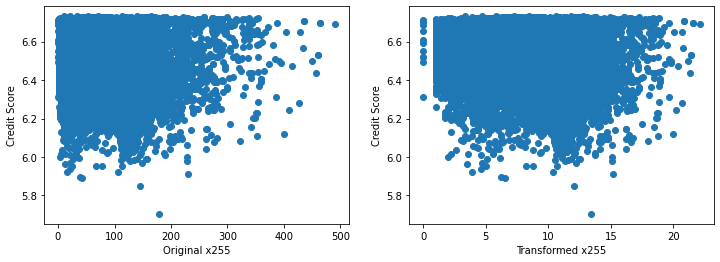

Original skewness 1.04, transformed skewness 0.05


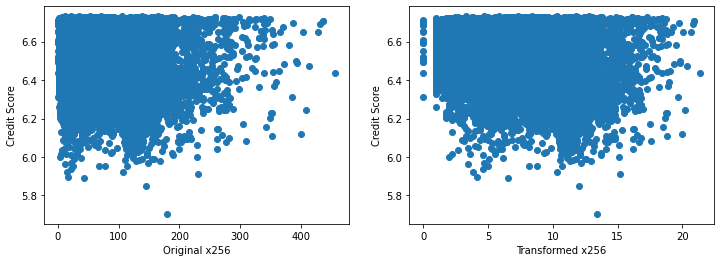

Original skewness 1.24, transformed skewness 0.25


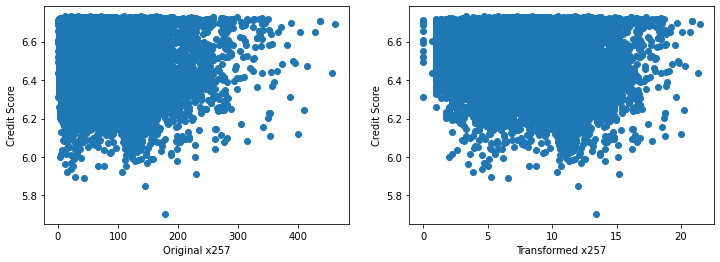

Original skewness 1.13, transformed skewness 0.12


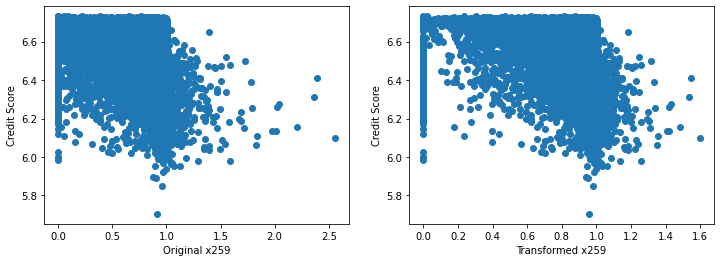

Original skewness -1.48, transformed skewness -2.61


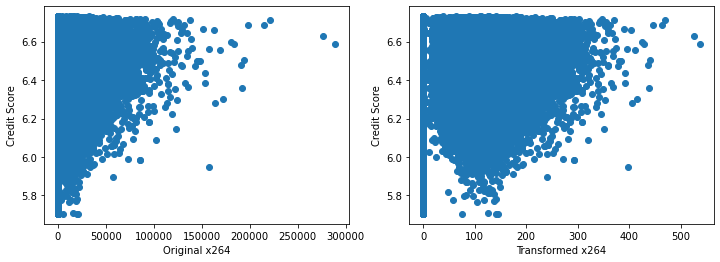

Original skewness 3.71, transformed skewness 1.41


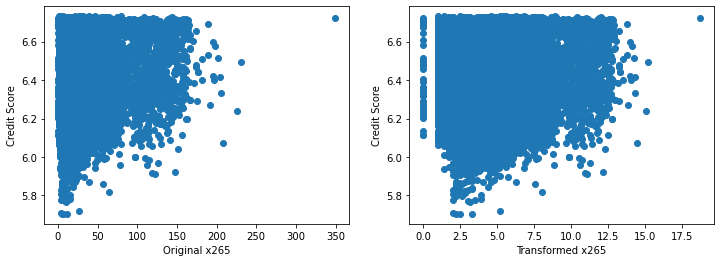

Original skewness 2.38, transformed skewness 0.76


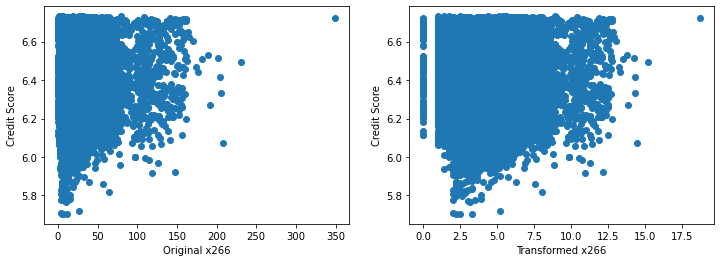

Original skewness 2.67, transformed skewness 0.79


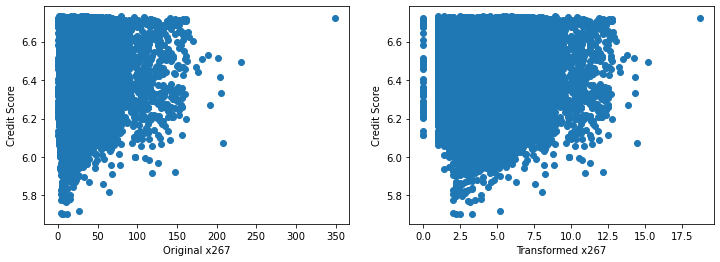

Original skewness 2.42, transformed skewness 0.69


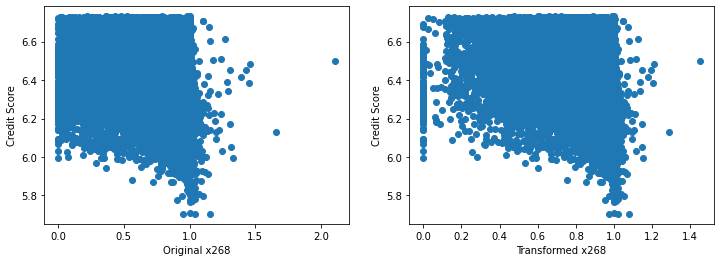

Original skewness -0.84, transformed skewness -1.57


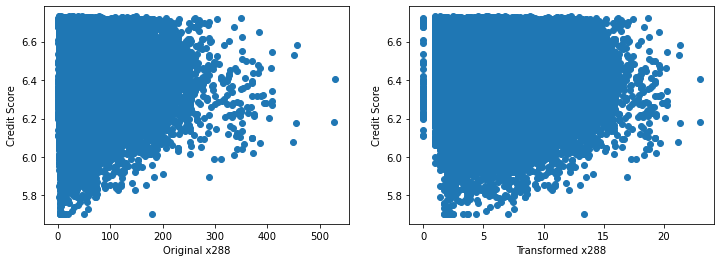

Original skewness 1.76, transformed skewness 0.66


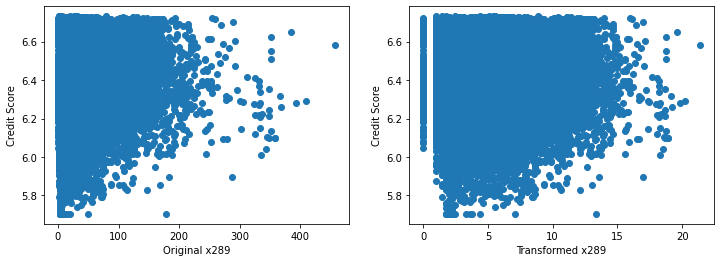

Original skewness 3.16, transformed skewness 1.34


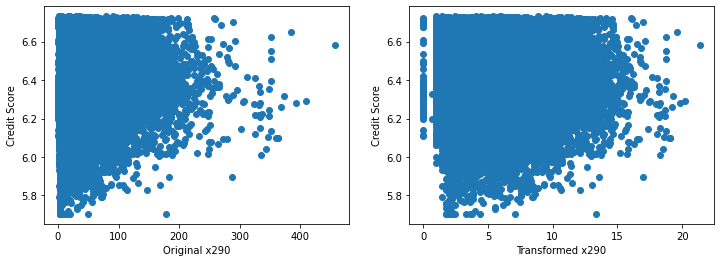

Original skewness 2.18, transformed skewness 0.79


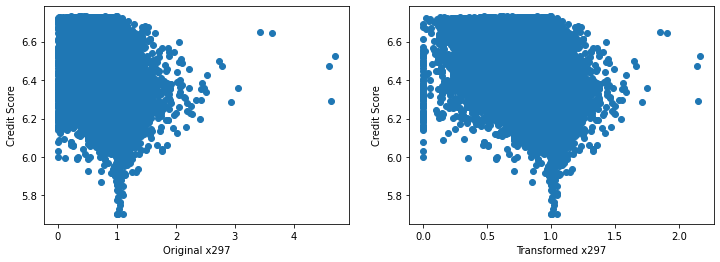

Original skewness -0.05, transformed skewness -1.34


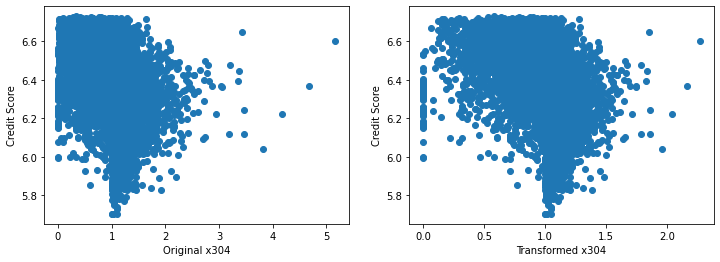

Original skewness 0.27, transformed skewness -1.63


In [33]:
# plotting the original or transformed variables vs credit score and seeing if there is a relationship

for var in cont_vars:
    
    plt.figure(figsize=(12,4))
    
    # plot the original variable vs sale price    
    plt.subplot(1, 2, 1)
    plt.scatter(df_train[var], np.log(df_train.y))
    plt.ylabel('Credit Score')
    plt.xlabel('Original ' + var)

    # plot transformed variable vs sale price
    plt.subplot(1, 2, 2)
    plt.scatter(tmp[var], np.log(df_train.y))
    plt.ylabel('Credit Score')
    plt.xlabel('Transformed ' + var)
                
    plt.show()
    print('Original skewness {:.2f}, transformed skewness {:.2f}'.format(df_train[var].skew(), tmp[var].skew()))

Square root transformation improved predectibility of x002, x004, x005, x015, x041, x057, x073, x235, x236, x237, x238, x239, x225, x256, x257, x264, x265, x266, x267, x288, x289, x290, 

Square transformation

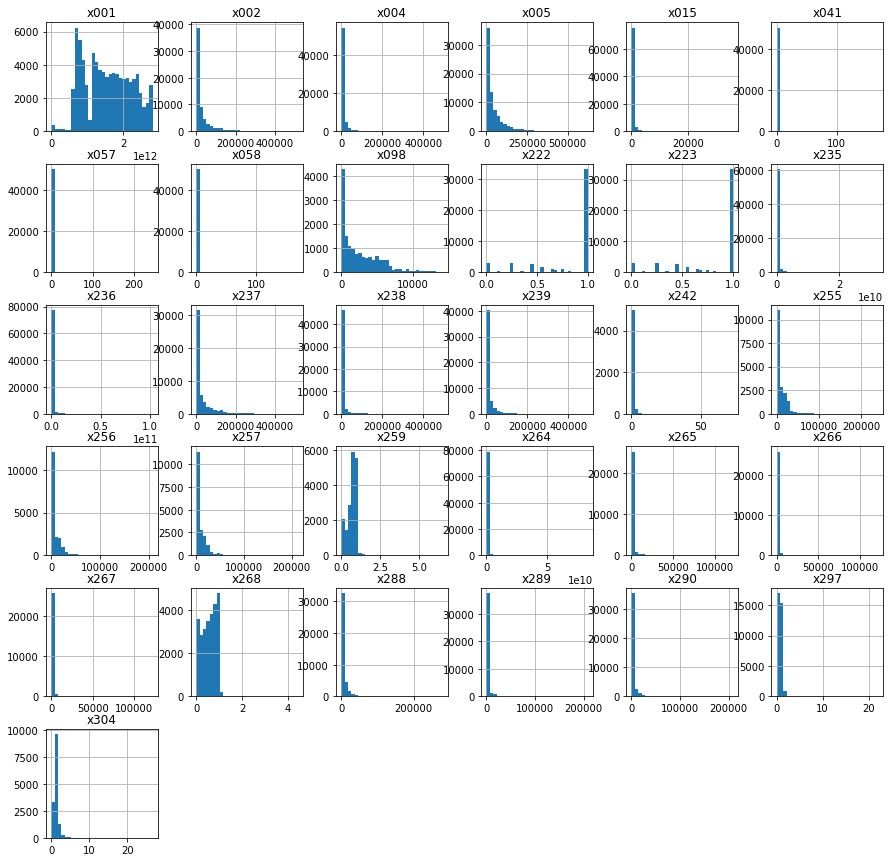

In [34]:
# Analysing the distributions of the variables after applying a square root transformation

# temporary copy of the data
tmp = df_train.copy()

for var in cont_vars:

    # transform the variable - yeo-johsnon
    tmp[var] = np.square(tmp[var])

    
# plot the histograms of the transformed variables
tmp[cont_vars].hist(bins=30, figsize=(15,15))
plt.show()

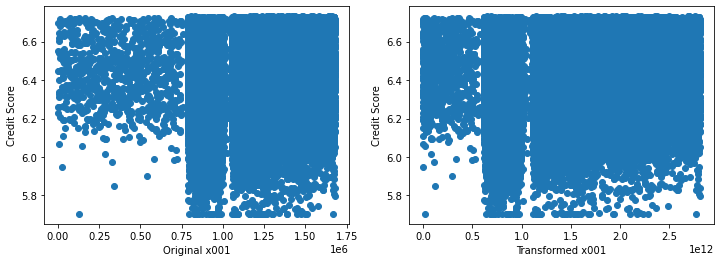

Original skewness -0.36, transformed skewness 0.12


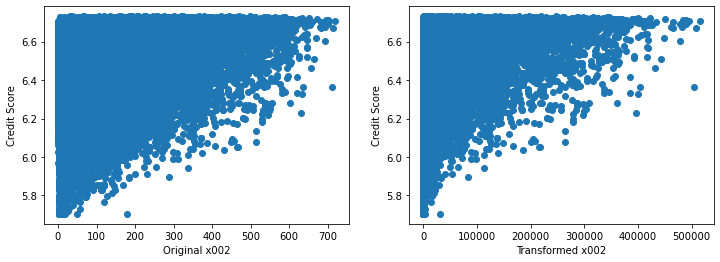

Original skewness 1.31, transformed skewness 3.22


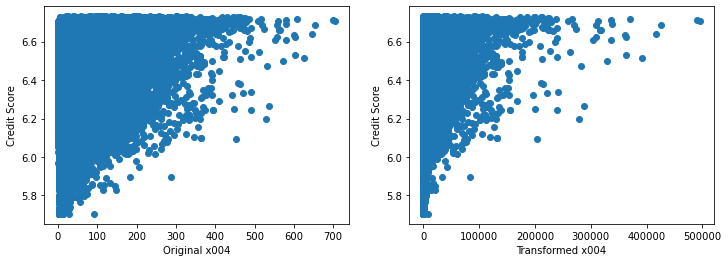

Original skewness 2.01, transformed skewness 6.86


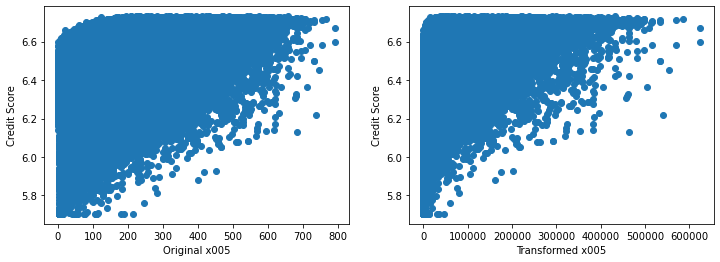

Original skewness 1.03, transformed skewness 2.59


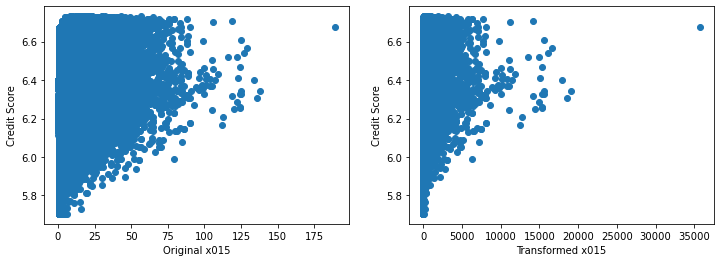

Original skewness 1.78, transformed skewness 9.56


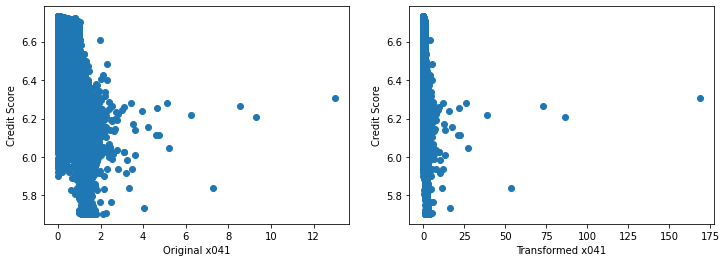

Original skewness 1.87, transformed skewness 87.39


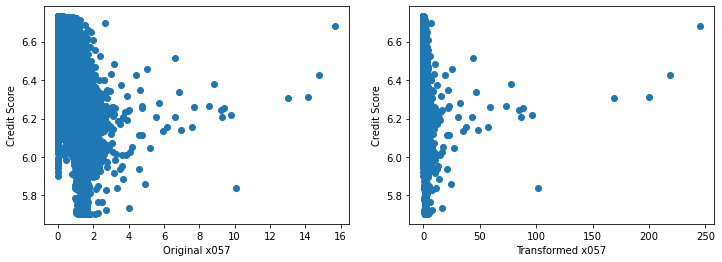

Original skewness 3.29, transformed skewness 66.35


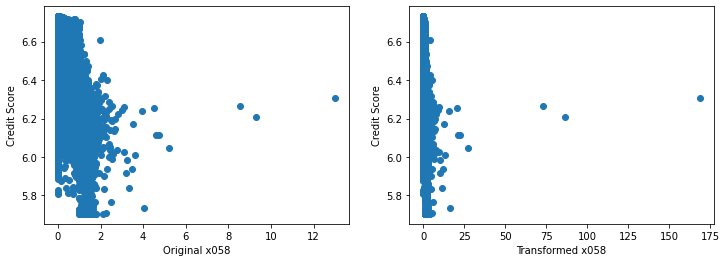

Original skewness 2.51, transformed skewness 101.65


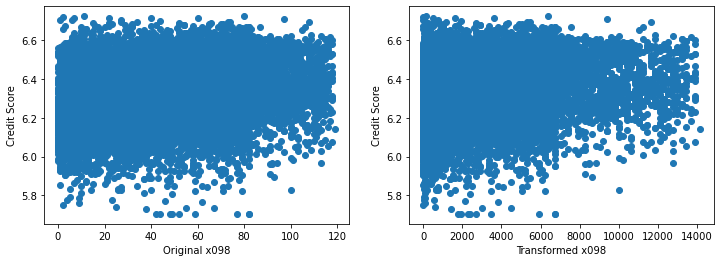

Original skewness 0.29, transformed skewness 1.27


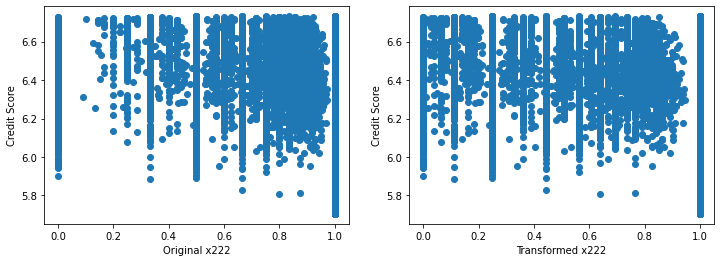

Original skewness -1.96, transformed skewness -1.28


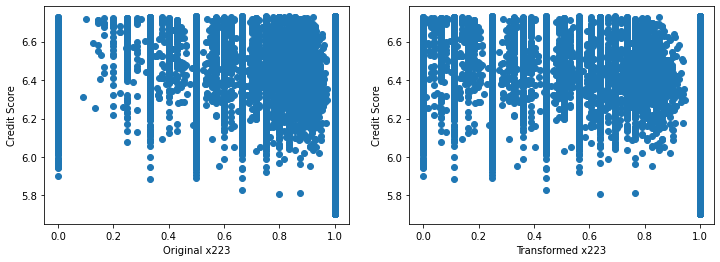

Original skewness -1.98, transformed skewness -1.30


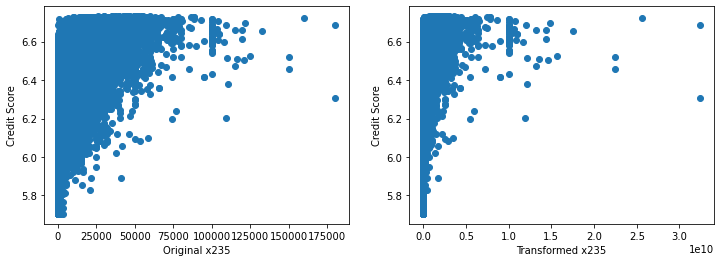

Original skewness 2.03, transformed skewness 13.35


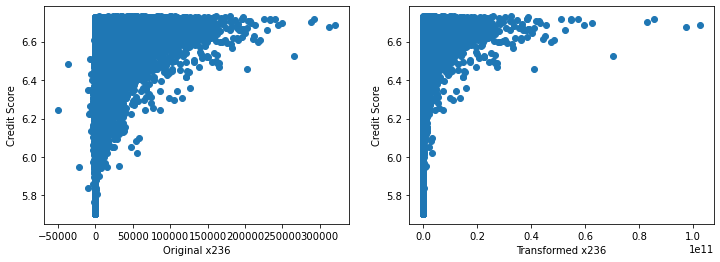

Original skewness 3.51, transformed skewness 14.46


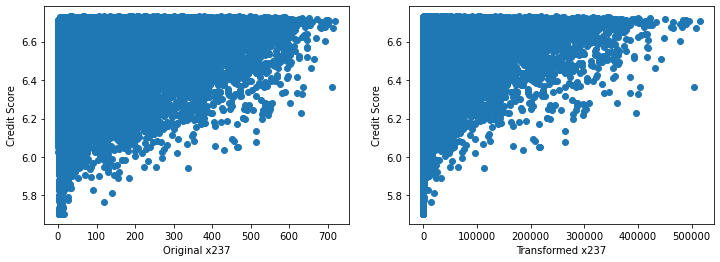

Original skewness 1.25, transformed skewness 2.98


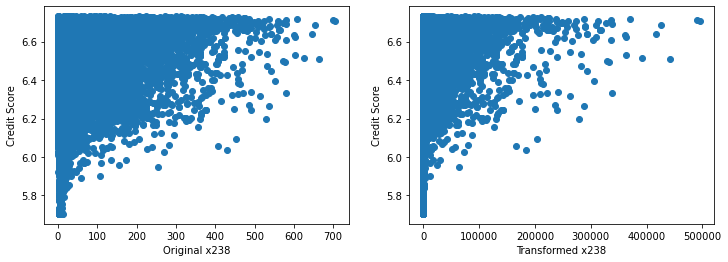

Original skewness 3.11, transformed skewness 7.50


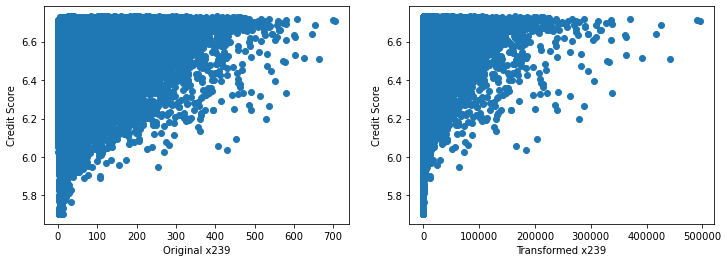

Original skewness 1.74, transformed skewness 4.89


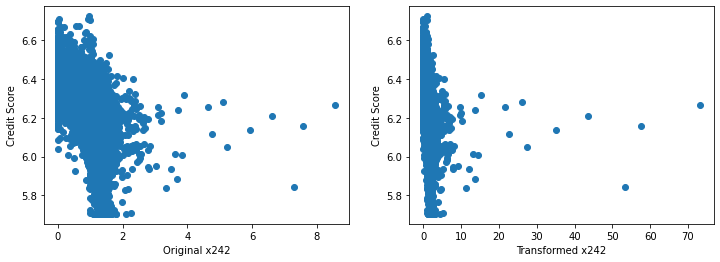

Original skewness 1.72, transformed skewness 20.11


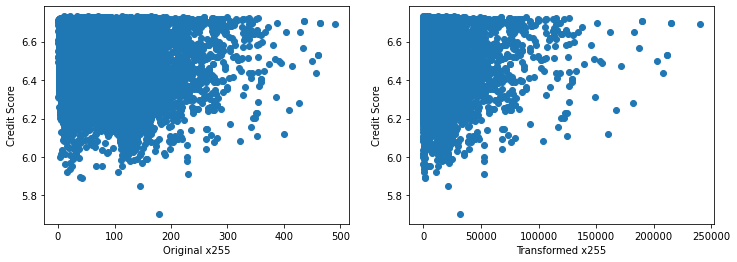

Original skewness 1.04, transformed skewness 4.16


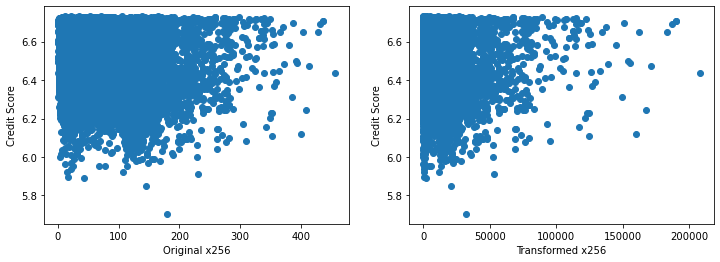

Original skewness 1.24, transformed skewness 4.27


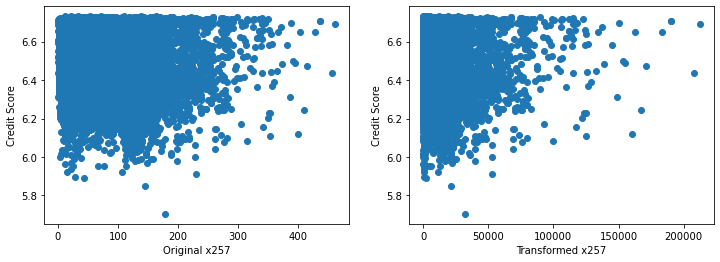

Original skewness 1.13, transformed skewness 4.14


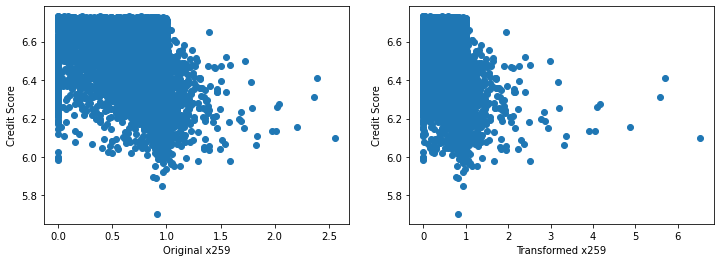

Original skewness -1.48, transformed skewness 0.80


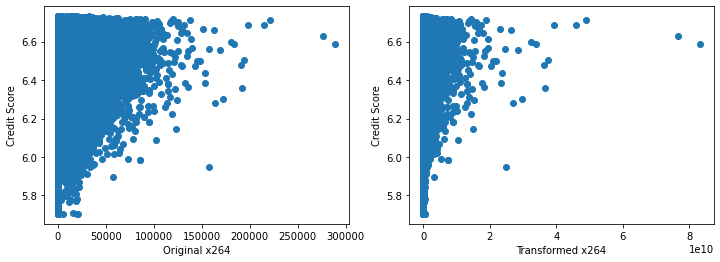

Original skewness 3.71, transformed skewness 27.13


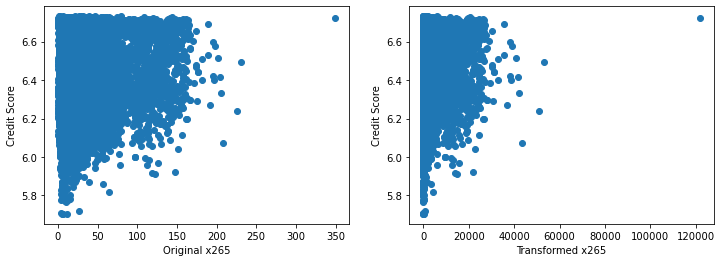

Original skewness 2.38, transformed skewness 7.28


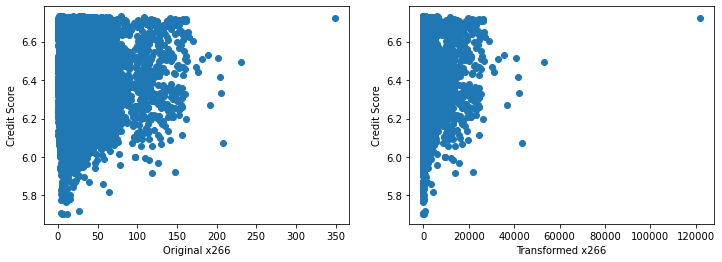

Original skewness 2.67, transformed skewness 11.85


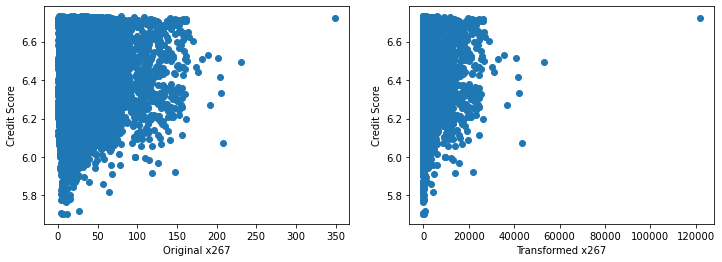

Original skewness 2.42, transformed skewness 10.87


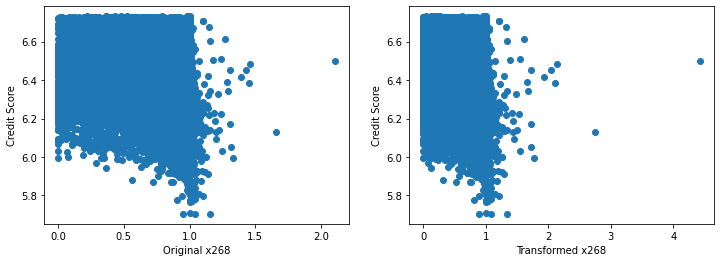

Original skewness -0.84, transformed skewness -0.11


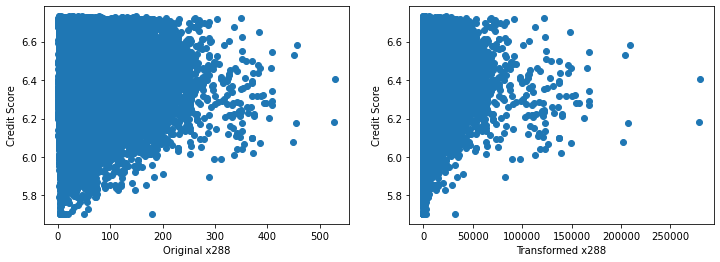

Original skewness 1.76, transformed skewness 5.78


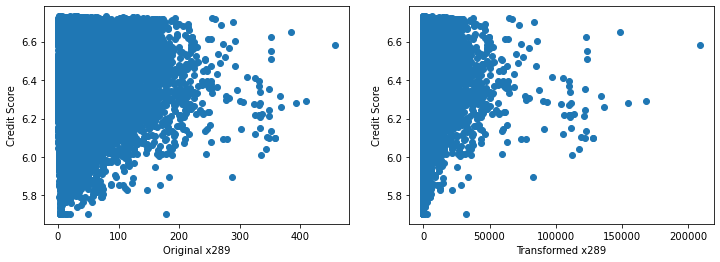

Original skewness 3.16, transformed skewness 9.94


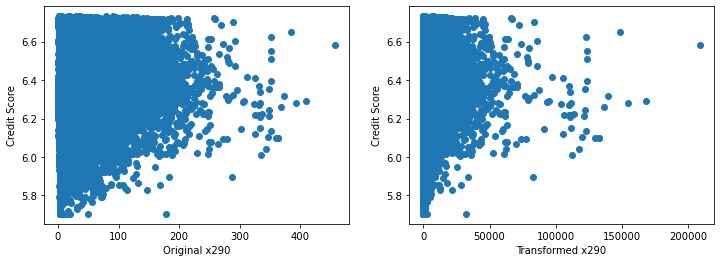

Original skewness 2.18, transformed skewness 7.78


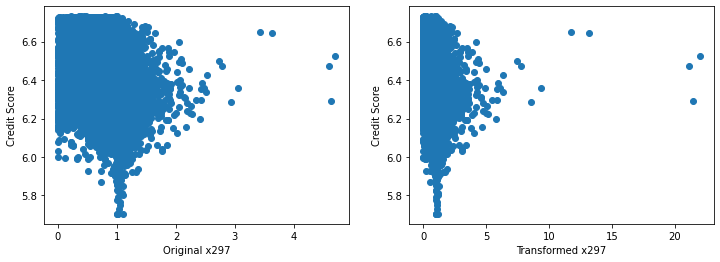

Original skewness -0.05, transformed skewness 9.28


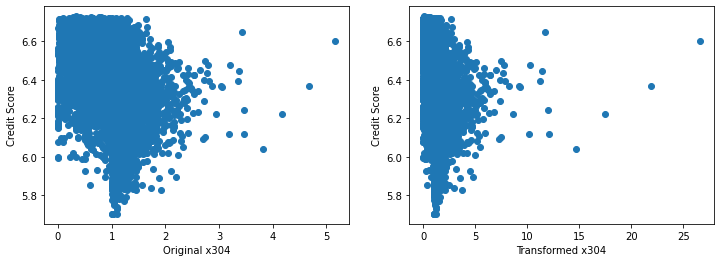

Original skewness 0.27, transformed skewness 7.23


In [35]:
# plotting the original or transformed variables vs credit score and seeing if there is a relationship

for var in cont_vars:
    
    plt.figure(figsize=(12,4))
    
    # plot the original variable vs sale price    
    plt.subplot(1, 2, 1)
    plt.scatter(df_train[var], np.log(df_train.y))
    plt.ylabel('Credit Score')
    plt.xlabel('Original ' + var)

    # plot transformed variable vs sale price
    plt.subplot(1, 2, 2)
    plt.scatter(tmp[var], np.log(df_train.y))
    plt.ylabel('Credit Score')
    plt.xlabel('Transformed ' + var)
                
    plt.show()
    print('Original skewness {:.2f}, transformed skewness {:.2f}'.format(df_train[var].skew(), tmp[var].skew()))

Square transformation improved predectibility of x001, x222, x223, x259, x268

<b>Skewed variables</b>

Transforming them into binary variables and seeing how predictive they are

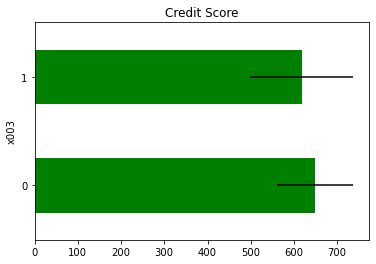

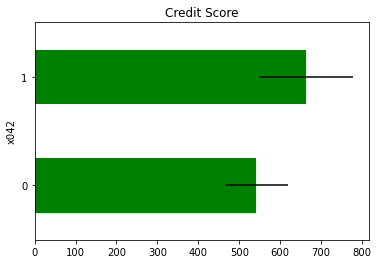

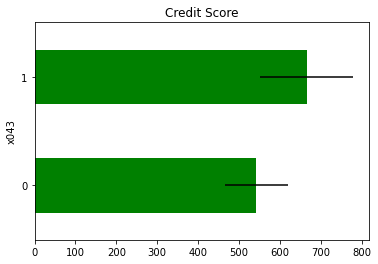

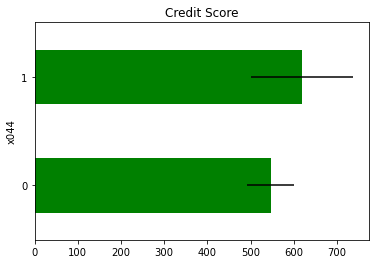

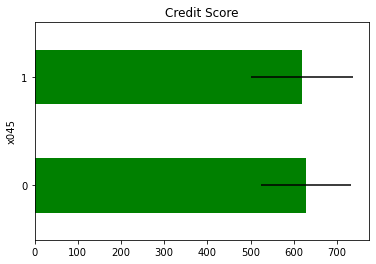

...

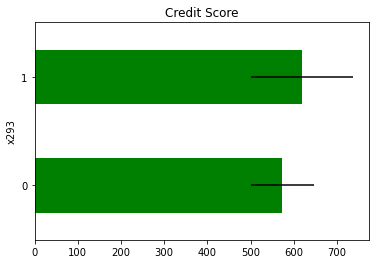

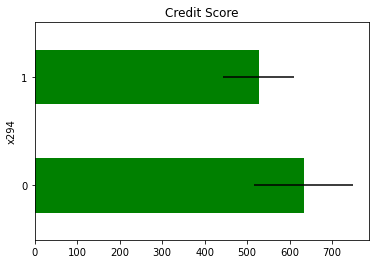

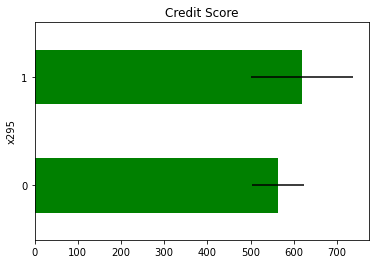

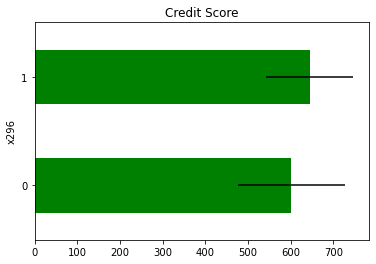

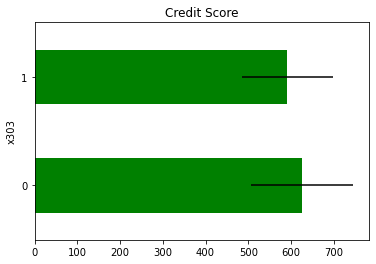

In [36]:
for var in skewed:
    
    tmp = df_train.copy()
    
    # map the variable values into 0 and 1
    tmp[var] = np.where(df_train[var] == 0, 0, 1)
    
    # determine mean sale price in the mapped values
    tmp = tmp.groupby(var)['y'].agg(['mean', 'std'])

    # plot into a bar graph
    tmp.plot(kind="barh", y="mean", legend=False,
             xerr="std", title="Credit Score", color='green')

    plt.show()

Some variables seems to be non-predictive, like x045, x234, x272, x291